In [1]:
from CovMat_mod2 import *
import gc
from cl_and_cov import *
from signal_to_noise import *
from fisher_FoM import *

In [2]:
import numpy as np
Omega_m=0.315
Omega_b=0.045
h=0.67
sigma8=0.8
n_s=0.96
w_0 = -1
w_a = 0
transfer_function = 'bbks'
fsky = 0.4
ell = np.arange(5, 3001)

In [3]:
# Input Cosmology object with a given set of parameters
cosmo = ccl.Cosmology(
    Omega_c = Omega_m-Omega_b, Omega_b=Omega_b, h=h, sigma8=sigma8, n_s=n_s,
    transfer_function=transfer_function)

In [4]:
arcmin_per_str=(180*60/np.pi)**2
#how many square arcminutes are there in a steradian 
numdenPerStr = arcmin_per_str*10.024

In [5]:
#binning in l
binl=10**np.linspace(np.log10(9), np.log10(2700), 20)

In [6]:
binl

array([   9.        ,   12.15114805,   16.40559988,   22.14965255,
         29.90485638,   40.3753708 ,   54.5119009 ,   73.59801981,
         99.36671498,  134.15774054,  181.13006303,  244.54869022,
        330.17192667,  445.77421806,  601.85205779,  812.57705086,
       1097.0826718 , 1481.20155189, 1999.8110386 , 2700.        ])

In [7]:
#try a symmetric distribution
def gaussian(x, mu, sig):
    return np.exp(-np.power(x - mu, 2.) / (2 * np.power(sig, 2.)))
dndz_s = np.zeros([600,2])
dndz_s[:, 0] = np.linspace(0.001, 4.001, 600)

In [8]:
dndz_s[100, 0]

0.668779632721202

In [9]:
dndz_s[0:200, 1] = gaussian(dndz_s[0:200, 0], (dndz_s[100, 0]+dndz_s[101, 0])/2, 0.5)
dndz_s[200:400, 1] = gaussian(dndz_s[200:400, 0], (dndz_s[301, 0]+dndz_s[300, 0])/2, 0.5)
dndz_s[400:600, 1] = gaussian(dndz_s[400:600, 0], (dndz_s[501, 0]+dndz_s[500, 0])/2, 0.5)

In [10]:
cl_s = {} 
cov_s = {}
redshifts_s = {}
cov_cosmic_var_s = {}
cov_shape_s = {}
sliced_dndz_s = {}

for n in range(1,7):
    for btype in ["z", "n"]:
        cov_s["{0}_{1}".format(btype, n)], cl_s["{0}_{1}".format(btype, n)], redshifts_s["{0}_{1}".format(btype, n)], sliced_dndz_s["{0}_{1}".format(btype, n)] = getDataArray(n_bins=n, bin_type=btype, cosmo=cosmo, dndz=dndz_s, ell=ell, numdenPerStr = numdenPerStr, fsky=0.4, shape_noise=0.23)
        cov_cosmic_var_s["{0}_{1}".format(btype, n)] = getCovMat(fsky, n, cl_s["{0}_{1}".format(btype, n)],  sliced_dndz_s["{0}_{1}".format(btype, n)], numdenPerStr, ell)
        cov_shape_s["{0}_{1}".format(btype, n)] = cov_s["{0}_{1}".format(btype, n)] - cov_cosmic_var_s["{0}_{1}".format(btype, n)]

In [11]:
for i in ["z", "n"]:
    for j in range(1,7):
        print(num_den(sliced_dndz_s["{0}_{1}".format(i,j)], numdenPerStr))

[1.18464663e+08]
[59080608.04864304 59384055.02042077]
[39488221.02302127 39488221.02302127 39488221.02302127]
[31604328.37935706 27476279.66928597 27579049.6023658  31805005.41805496]
[24682981.67283034 20545170.81933648 27846129.38036034 20421973.50410908
 24968407.69242757]
[19592387.02562177 19895833.9973995  19592387.02562177 19895833.9973995
 19592387.02562177 19895833.9973995 ]
[1.18464663e+08]
[59080608.04864304 59384055.02042077]
[39488221.02302127 39488221.02302127 39488221.02302127]
[29441871.26550408 29638736.78313896 29707119.18306949 29676935.83735127]
[23680759.67573693 23695493.46185772 23507830.81544695 23858936.41763055
 23721642.69839163]
[19592387.02562177 19895833.9973995  19592387.02562177 19895833.9973995
 19592387.02562177 19895833.9973995 ]


In [12]:
for i in ["z", "n"]:
    for j in range(1,7):
        print(np.sum(num_den(sliced_dndz_s["{0}_{1}".format(i,j)], numdenPerStr)))

118464663.0690638
118464663.06906381
118464663.0690638
118464663.0690638
118464663.06906381
118464663.0690638
118464663.0690638
118464663.06906381
118464663.0690638
118464663.0690638
118464663.06906378
118464663.0690638


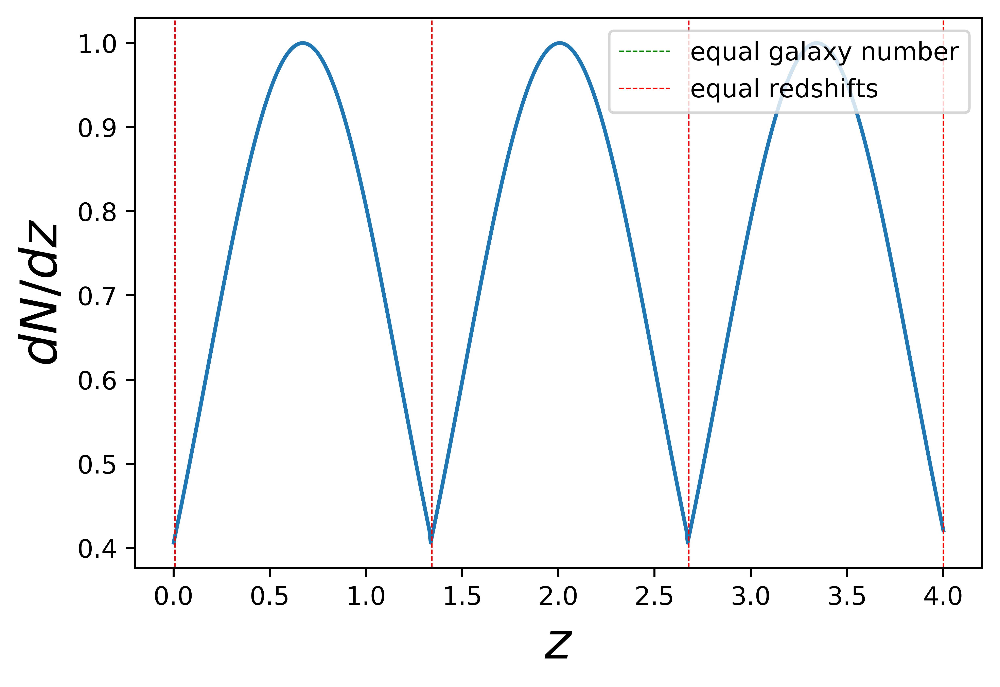

In [13]:
plt.plot(dndz_s[:,0], dndz_s[:,1])
plt.xlabel(r'$z$',fontsize=20)
plt.ylabel(r'$dN/dz$',fontsize=20)
for x in redshifts_s["n_3"]:
    plt.axvline(x, linewidth=0.5, color="g", linestyle="--")
plt.axvline(x, linewidth=0.5, color="g", linestyle="--", label="equal galaxy number")

for x in redshifts_s["z_3"]:
    plt.axvline(x, linewidth=0.5, color="r", linestyle="--")
plt.axvline(x, linewidth=0.5, color="r", linestyle="--", label="equal redshifts")

plt.legend(loc='upper right')
plt.show()

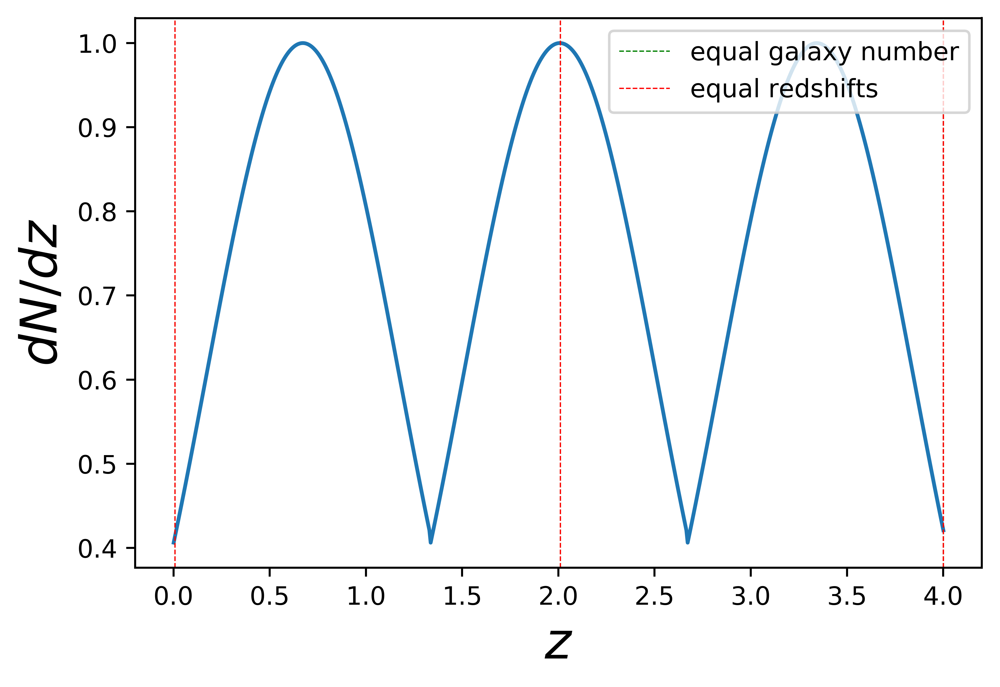

In [14]:
plt.plot(dndz_s[:,0], dndz_s[:,1])
plt.xlabel(r'$z$',fontsize=20)
plt.ylabel(r'$dN/dz$',fontsize=20)
for x in redshifts_s["n_2"]:
    plt.axvline(x, linewidth=0.5, color="g", linestyle="--")
plt.axvline(x, linewidth=0.5, color="g", linestyle="--", label="equal galaxy number")

for x in redshifts_s["z_2"]:
    plt.axvline(x, linewidth=0.5, color="r", linestyle="--")
plt.axvline(x, linewidth=0.5, color="r", linestyle="--", label="equal redshifts")

plt.legend(loc='upper right')
plt.show()

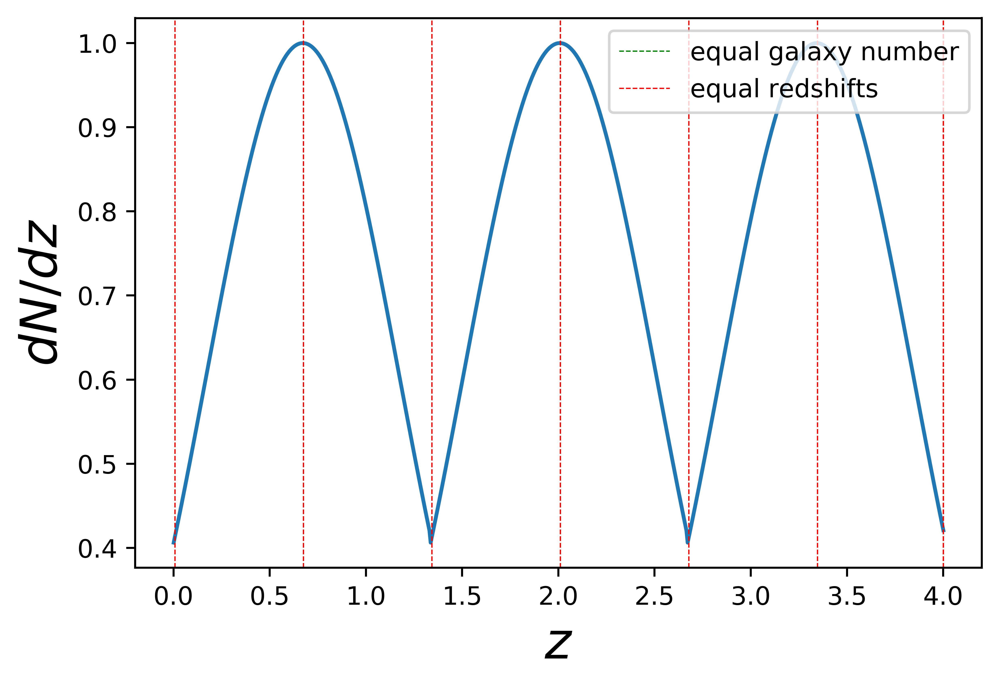

In [15]:
plt.plot(dndz_s[:,0], dndz_s[:,1])
plt.xlabel(r'$z$',fontsize=20)
plt.ylabel(r'$dN/dz$',fontsize=20)
for x in redshifts_s["n_6"]:
    plt.axvline(x, linewidth=0.5, color="g", linestyle="--")
plt.axvline(x, linewidth=0.5, color="g", linestyle="--", label="equal galaxy number")

for x in redshifts_s["z_6"]:
    plt.axvline(x, linewidth=0.5, color="r", linestyle="--")
plt.axvline(x, linewidth=0.5, color="r", linestyle="--", label="equal redshifts")

plt.legend(loc='upper right')
plt.show()

In [16]:
stn_s = {}
for i in ["z", "n"]:
    for j in range(1,7):
        stn_s["{0}_{1}".format(i,j)] = SignalToNoise(bins_in_z=j, binl=binl, cl = cl_s["{0}_{1}".format(i, j)], cov = cov_s["{0}_{1}".format(i, j)], ell=ell)

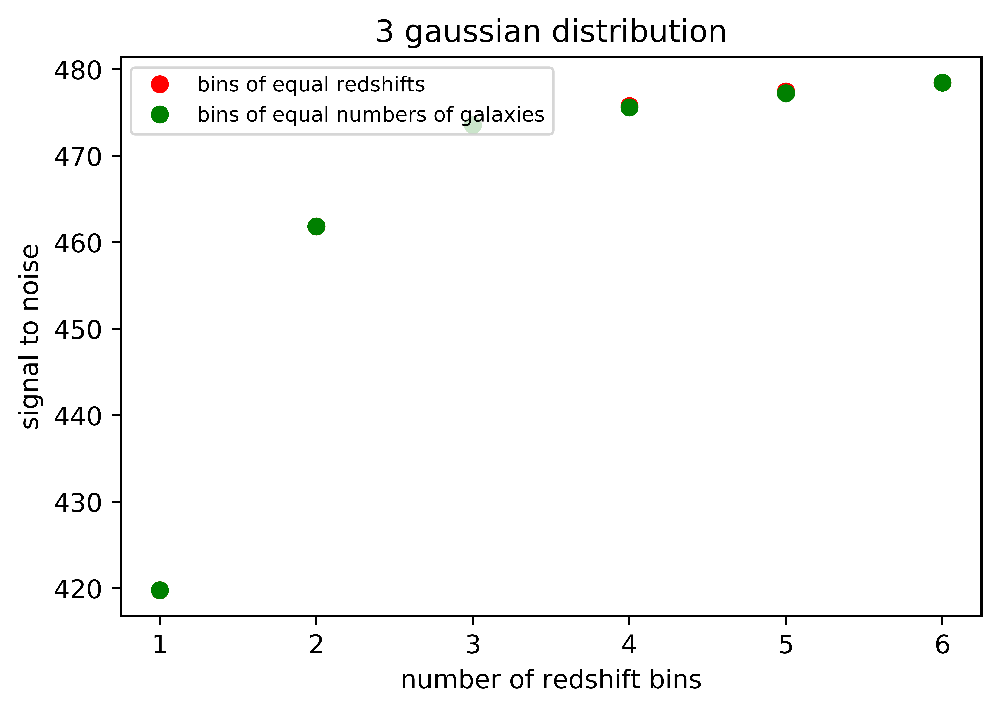

In [17]:
params = {'legend.fontsize': 10,
          'legend.handlelength': 2}
plt.rcParams.update(params)
plt.figure()
plt.plot([1, 2, 3, 4, 5, 6], [stn_s["z_1"], stn_s["z_2"], stn_s["z_3"], stn_s["z_4"], stn_s["z_5"], stn_s["z_6"]],
         color='r', linestyle='None', marker ="o", markersize = 6.0, label = "bins of equal redshifts")
plt.plot([1, 2, 3, 4, 5, 6], [stn_s["n_1"], stn_s["n_2"], stn_s["n_3"], stn_s["n_4"], stn_s["n_5"], stn_s["n_6"]],
         color='g', linestyle='None', marker ="o", markersize = 6.0, label = "bins of equal numbers of galaxies")
plt.xlabel("number of redshift bins")
plt.ylabel("signal to noise")
plt.legend(loc="upper left", fontsize=8)
plt.title('3 gaussian distribution')
plt.show() 

the tomographic bin division looks reasonable

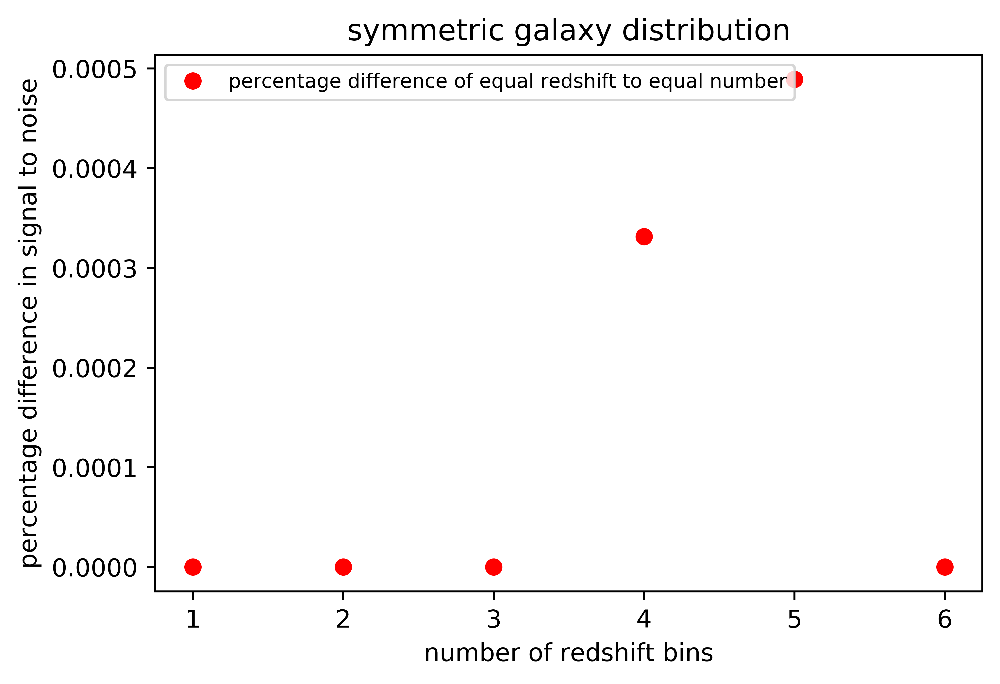

In [18]:
params = {'legend.fontsize': 10,
          'legend.handlelength': 2}
plt.rcParams.update(params)
plt.figure()
plt.plot([1, 2, 3, 4, 5, 6], [stn_s["z_1"]/stn_s["n_1"]-1, stn_s["z_2"]/stn_s["n_2"]-1, stn_s["z_3"]/stn_s["n_3"]-1, stn_s["z_4"]/stn_s["n_4"]-1, stn_s["z_5"]/stn_s["n_5"]-1, stn_s["z_6"]/stn_s["n_6"]-1],
         color='r', linestyle='None', marker ="o", markersize = 6.0, label = "percentage difference of equal redshift to equal number")
plt.xlabel("number of redshift bins")
plt.ylabel("percentage difference in signal to noise")
plt.legend(loc="upper left", fontsize=8)
plt.title('symmetric galaxy distribution')
plt.show() 

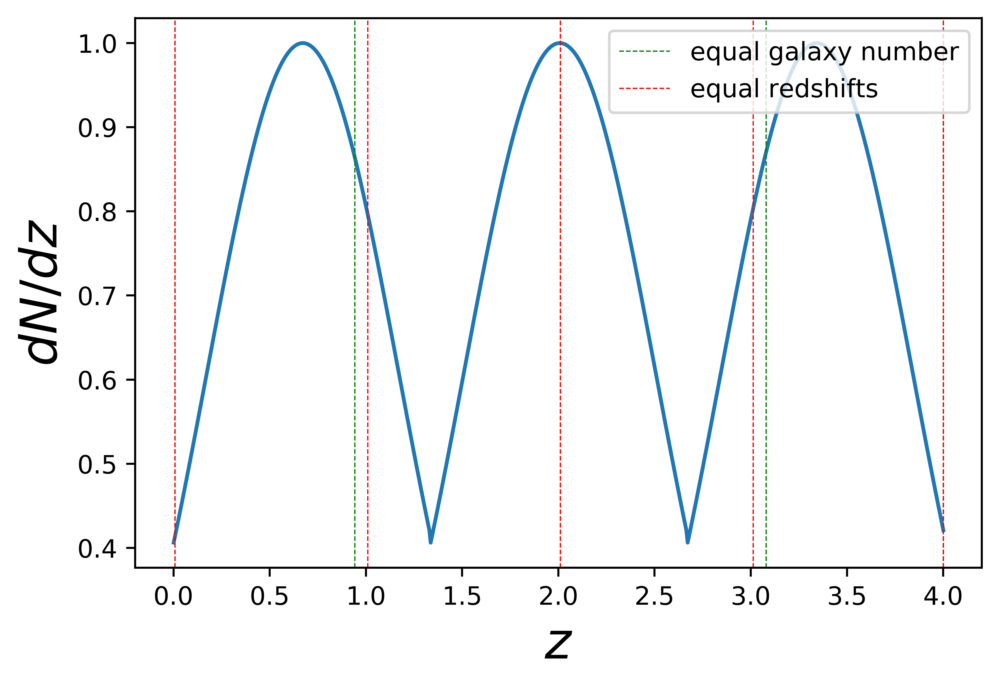

In [19]:
plt.plot(dndz_s[:,0], dndz_s[:,1])
plt.xlabel(r'$z$',fontsize=20)
plt.ylabel(r'$dN/dz$',fontsize=20)
for x in redshifts_s["n_4"]:
    plt.axvline(x, linewidth=0.5, color="g", linestyle="--")
plt.axvline(x, linewidth=0.5, color="g", linestyle="--", label="equal galaxy number")

for x in redshifts_s["z_4"]:
    plt.axvline(x, linewidth=0.5, color="r", linestyle="--")
plt.axvline(x, linewidth=0.5, color="r", linestyle="--", label="equal redshifts")

plt.legend(loc='upper right')
plt.show()


for 4 redshift bins, we would expect bin 1 of equal redshift having higher signal than bin 1 of equal galaxy number. We would also expect bin 4 of equal galaxy number having higher signal than bin 4 of equal redshift. let's check that.

In [20]:
binned_cl_s = {}
binned_cov_s = {}
binned_cov_cosvar_s = {}
binned_cov_shape_s = {}
binned_cl_s["z_4"] = binnedCl(4, binl, cl_s["z_4"], ell)
binned_cl_s["n_4"] = binnedCl(4, binl, cl_s["n_4"], ell)
binned_cov_s["z_4"] = binnedCov(4, binl, cov_s["z_4"], ell)
binned_cov_s["n_4"] = binnedCov(4, binl, cov_s["n_4"], ell)
binned_cov_cosvar_s["z_4"] = binnedCov(4, binl, cov_cosmic_var_s["z_4"], ell)
binned_cov_shape_s["z_4"] = binnedCov(4, binl, cov_shape_s["z_4"], ell)
binned_cov_cosvar_s["n_4"] = binnedCov(4, binl, cov_cosmic_var_s["n_4"], ell)
binned_cov_shape_s["n_4"] = binnedCov(4, binl, cov_shape_s["n_4"], ell)

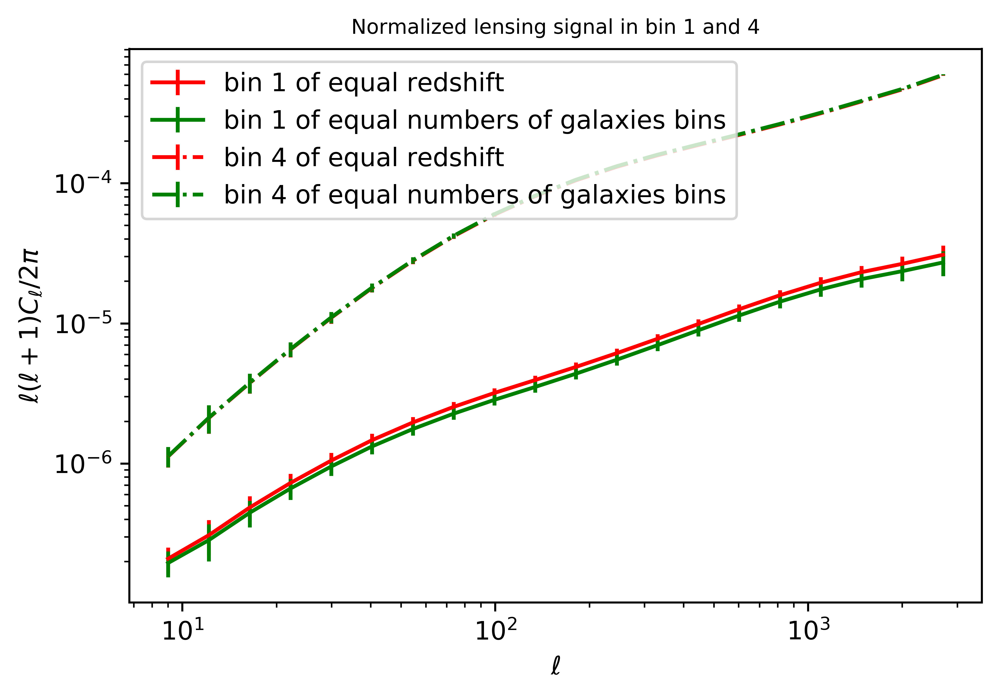

In [21]:
plt.figure()

plt.errorbar(binl, normalizing(binned_cl_s["z_4"][0], binl), yerr = normalizing(np.sqrt(binned_cov_s["z_4"][:, 0, 0]), binl), color='r', label = "bin 1 of equal redshift")
plt.errorbar(binl, normalizing(binned_cl_s["n_4"][0], binl), yerr = normalizing(np.sqrt(binned_cov_s["n_4"][:, 0, 0]), binl), color='g', label = "bin 1 of equal numbers of galaxies bins")

plt.errorbar(binl, normalizing(binned_cl_s["z_4"][9], binl), yerr = normalizing(np.sqrt(binned_cov_s["z_4"][:, 9, 9]), binl), color='r', ls='-.', label = "bin 4 of equal redshift")
plt.errorbar(binl, normalizing(binned_cl_s["n_4"][9], binl), yerr = normalizing(np.sqrt(binned_cov_s["n_4"][:, 9, 9]), binl), color='g', ls='-.', label = "bin 4 of equal numbers of galaxies bins")


plt.xscale('log')
plt.yscale('log')
plt.xlabel(r'$\ell$')
plt.ylabel(r'$\ell(\ell+1)C_{\ell}/2\pi$')
plt.legend(loc="upper left")
plt.title("Normalized lensing signal in bin 1 and 4", fontsize=8)
plt.show() 

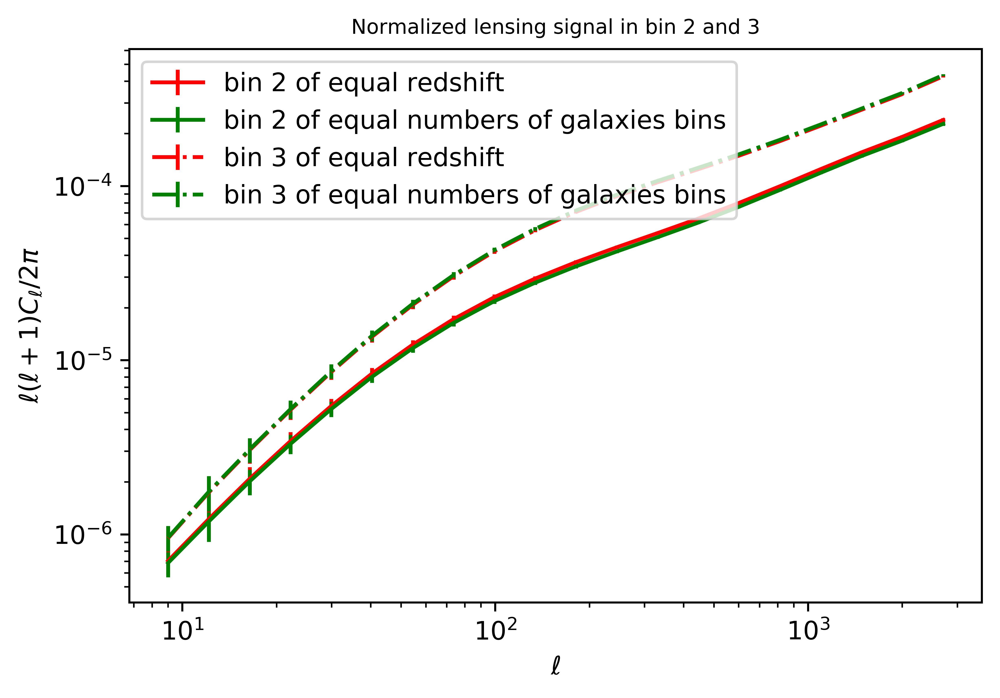

In [22]:
plt.figure()

plt.errorbar(binl, normalizing(binned_cl_s["z_4"][4], binl), yerr = normalizing(np.sqrt(binned_cov_s["z_4"][:, 4, 4]), binl), color='r', label = "bin 2 of equal redshift")
plt.errorbar(binl, normalizing(binned_cl_s["n_4"][4], binl), yerr = normalizing(np.sqrt(binned_cov_s["n_4"][:, 4, 4]), binl), color='g', label = "bin 2 of equal numbers of galaxies bins")

plt.errorbar(binl, normalizing(binned_cl_s["z_4"][7], binl), yerr = normalizing(np.sqrt(binned_cov_s["z_4"][:, 7, 7]), binl), color='r', ls='-.', label = "bin 3 of equal redshift")
plt.errorbar(binl, normalizing(binned_cl_s["n_4"][7], binl), yerr = normalizing(np.sqrt(binned_cov_s["n_4"][:, 7, 7]), binl), color='g', ls='-.', label = "bin 3 of equal numbers of galaxies bins")


plt.xscale('log')
plt.yscale('log')
plt.xlabel(r'$\ell$')
plt.ylabel(r'$\ell(\ell+1)C_{\ell}/2\pi$')
plt.legend(loc="upper left")
plt.title("Normalized lensing signal in bin 2 and 3", fontsize=8)
plt.show() 

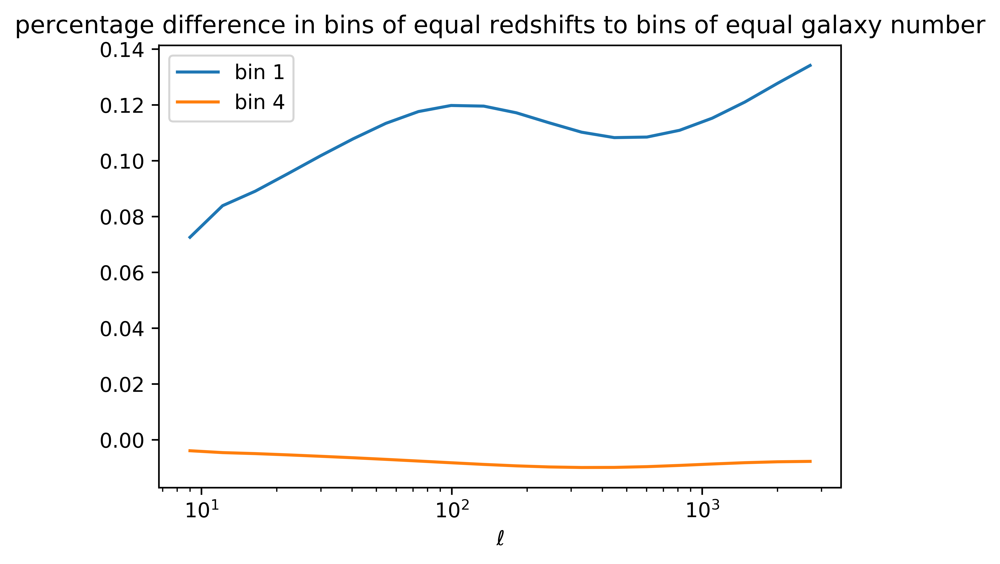

In [23]:
plt.figure()

plt.plot(binl, normalizing(binned_cl_s["z_4"][0], binl)/normalizing(binned_cl_s["n_4"][0], binl)-1, label = "bin 1")
plt.plot(binl, normalizing(binned_cl_s["z_4"][9], binl)/normalizing(binned_cl_s["n_4"][9], binl)-1, label = "bin 4")

plt.xscale('log')
plt.xlabel(r'$\ell$')
plt.legend(loc="upper left")
plt.title("percentage difference in bins of equal redshifts to bins of equal galaxy number")
plt.show() 

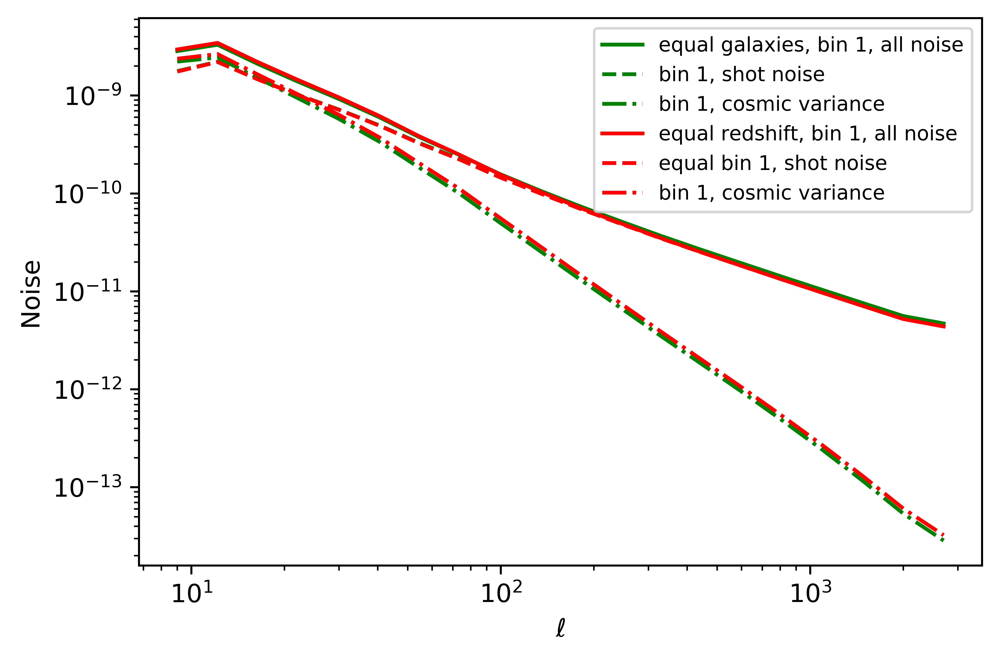

In [24]:
plt.figure()

plt.plot(binl, np.sqrt(binned_cov_s["n_4"][:, 0, 0]), color='g', label = "equal galaxies, bin 1, all noise")
plt.plot(binl, np.sqrt(binned_cov_shape_s["n_4"][:, 0, 0]), color='g', ls="--", label = "bin 1, shot noise")
plt.plot(binl, np.sqrt(binned_cov_cosvar_s["n_4"][:, 0, 0]), color='g', ls="-.", label = "bin 1, cosmic variance")

plt.plot(binl, np.sqrt(binned_cov_s["z_4"][:, 0, 0]), color='r', label = "equal redshift, bin 1, all noise")
plt.plot(binl, np.sqrt(binned_cov_shape_s["z_4"][:, 0, 0]), color='r', ls="--", label = "equal bin 1, shot noise")
plt.plot(binl, np.sqrt(binned_cov_cosvar_s["z_4"][:, 0, 0]), color='r', ls="-.", label = "bin 1, cosmic variance")

plt.xscale('log')
plt.yscale('log')

plt.xlabel(r'$\ell$')
plt.ylabel('Noise')
plt.legend(loc="upper right", fontsize=8)
plt.show() 

large scale==> cosmic variance

small scale==> shot noise

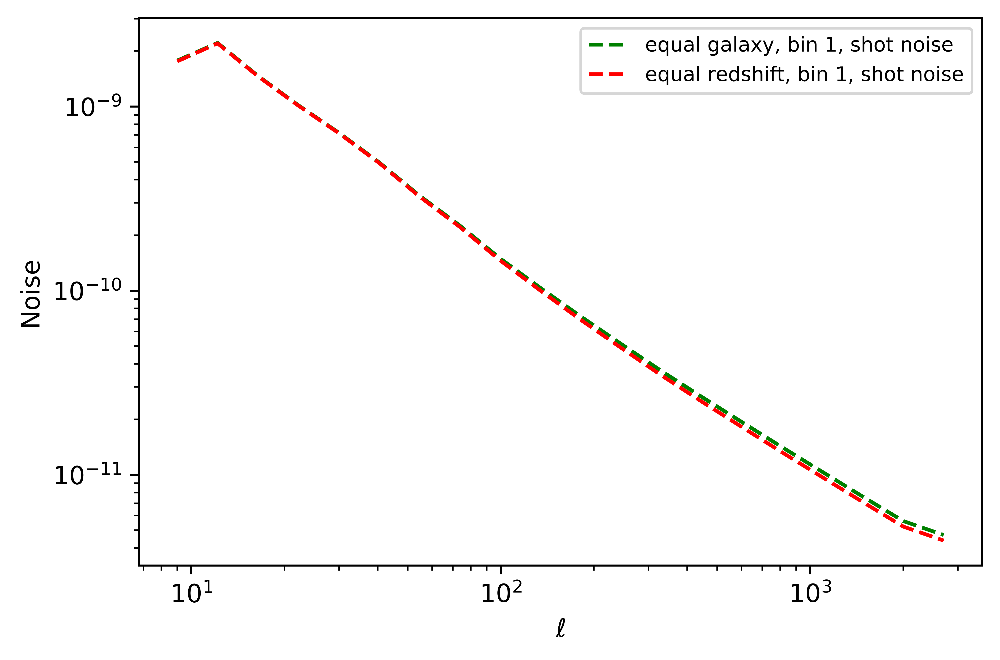

In [25]:
plt.figure()

plt.plot(binl, np.sqrt(binned_cov_shape_s["n_4"][:, 0, 0]), color='g', ls="--", label = "equal galaxy, bin 1, shot noise")

plt.plot(binl, np.sqrt(binned_cov_shape_s["z_4"][:, 0, 0]), color='r', ls="--", label = "equal redshift, bin 1, shot noise")
plt.xscale('log')
plt.yscale('log')

plt.xlabel(r'$\ell$')
plt.ylabel('Noise')
plt.legend(loc="upper right", fontsize=8)
plt.show() 

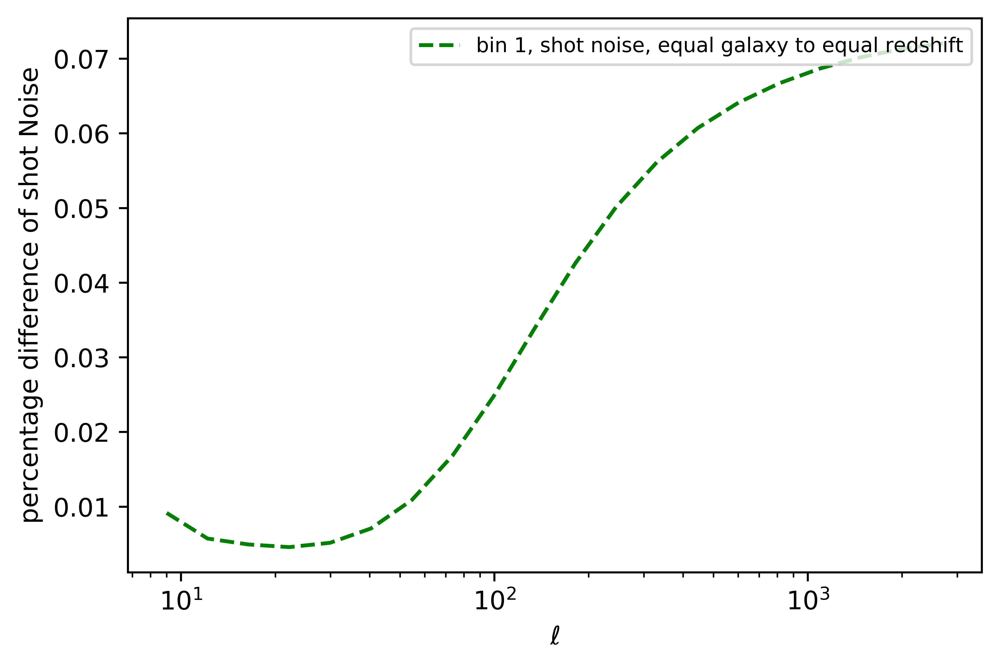

In [26]:
plt.figure()

plt.plot(binl, np.sqrt(binned_cov_shape_s["n_4"][:, 0, 0])/np.sqrt(binned_cov_shape_s["z_4"][:, 0, 0])-1, color='g', ls="--", label = "bin 1, shot noise, equal galaxy to equal redshift")
plt.xscale('log')

plt.xlabel(r'$\ell$')
plt.ylabel('percentage difference of shot Noise')
plt.legend(loc="upper right", fontsize=8)
plt.show() 

the shot noises in the covariance matrix in each autocorrelation bin enter as


$\frac{fsky}{2\ell +1} [2(cl+\frac{\sigma_{\epsilon}^2}{2*n_g})^2- 2cl^2]$ =

$\frac{2 fsky}{2\ell +1}[cl \frac {\sigma_{\epsilon}^2}{n_g} + \frac{\sigma_{\epsilon}^4}{4 n_g^2}]$


bin 1 of equal redshift extend to higher redshift compared to bin 1 of equal galaxy, therefore, bin 1 of equal redshift would include more number of galaxy, as well as higher signal.
the shot noise scale as 1/number of galaxies^2 as well as signal, then the equal redshift bin should have lower noise contribution from shot noise, which is what we see in the plot

let's check if the calculation agrees with the plot above

In [27]:
num_den(sliced_dndz_s["z_4"], numdenPerStr)

array([31604328.37935706, 27476279.66928597, 27579049.6023658 ,
       31805005.41805496])

In [28]:
num_den(sliced_dndz_s["n_4"], numdenPerStr)

array([29441871.26550408, 29638736.78313896, 29707119.18306949,
       29676935.83735127])

In [29]:
cl_s["z_4"].shape

(10, 2996)

In [30]:
ngz41=num_den(sliced_dndz_s["z_4"], numdenPerStr)[0]
shape_noise_z_1 = 2*(fsky/(2*ell+1))*(cl_s["z_4"][0, :]*0.23/ngz41 + 0.25*(0.23/ngz41)**2)
ngn41=num_den(sliced_dndz_s["n_4"], numdenPerStr)[0]
shape_noise_n_1 = 2*(fsky/(2*ell+1))*(cl_s["n_4"][0, :]*0.23/ngn41 + 0.25*(0.23/ngn41)**2)


In [31]:
shape_noise_n_1.shape

(2996,)

In [32]:
shape_noise_n1=binnedCov(1, binl, shape_noise_n_1.reshape(2996, 1, 1), ell)
shape_noise_z1=binnedCov(1, binl, shape_noise_z_1.reshape(2996, 1, 1), ell)

In [33]:
shape_noise_z1.reshape(20)

array([4.95103057e-19, 7.75739403e-19, 3.40791978e-19, 1.63723931e-19,
       8.24385221e-20, 3.91397394e-20, 1.68988718e-20, 7.90238153e-21,
       3.41813637e-21, 1.60506245e-21, 7.72341299e-22, 3.83313041e-22,
       1.92414359e-22, 9.98431272e-23, 5.26831491e-23, 2.78917426e-23,
       1.49757619e-23, 8.05324338e-24, 4.37218721e-24, 3.08348780e-24])

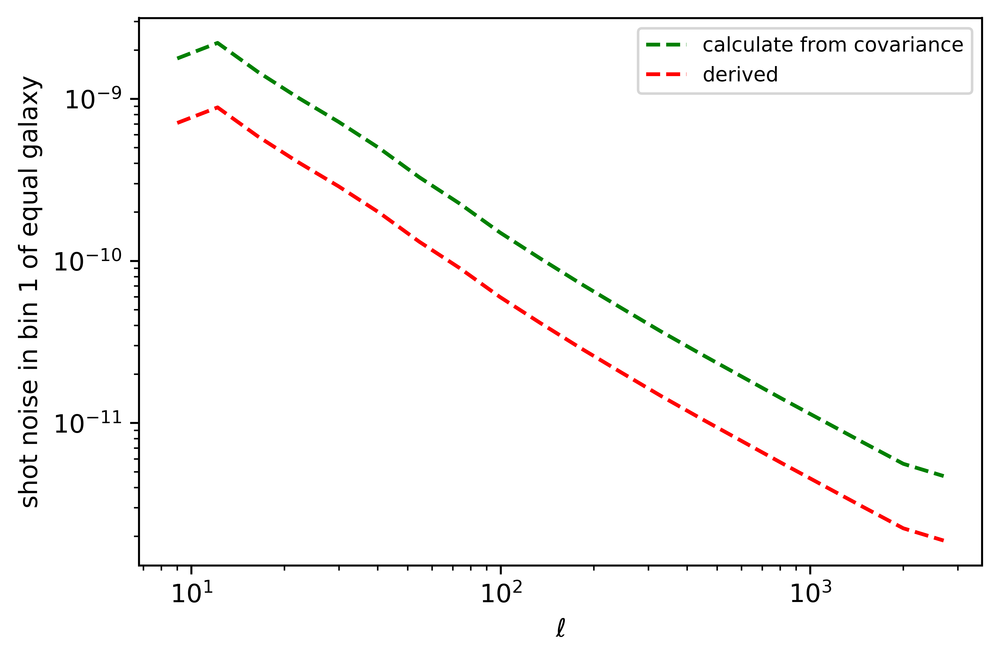

In [34]:
plt.figure()

plt.plot(binl, np.sqrt(binned_cov_shape_s["n_4"][:, 0, 0]), color='g', ls="--", label = "calculate from covariance")

plt.plot(binl, np.sqrt(shape_noise_n1.reshape(20)), color='r', ls="--", label = "derived")
plt.xscale('log')
plt.yscale('log')

plt.xlabel(r'$\ell$')
plt.ylabel('shot noise in bin 1 of equal galaxy')
plt.legend(loc="upper right", fontsize=8)
plt.show() 

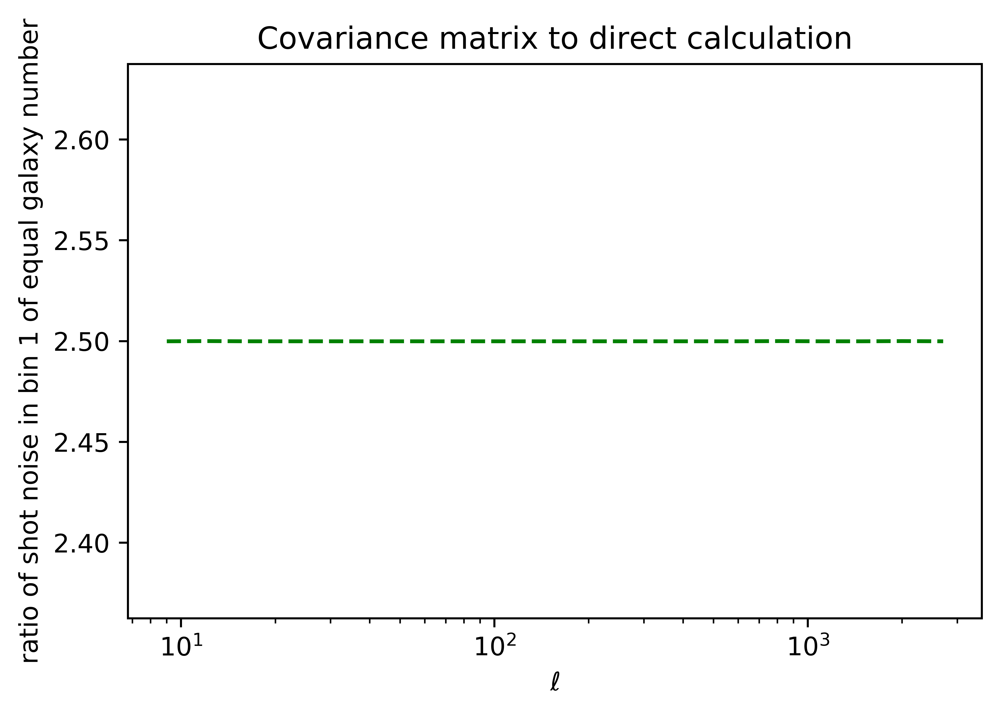

In [35]:
plt.figure()

plt.plot(binl, np.sqrt(binned_cov_shape_s["n_4"][:, 0, 0])/np.sqrt(shape_noise_n1.reshape(20)), color='g', ls="--")

plt.xscale('log')

plt.xlabel(r'$\ell$')
plt.ylabel('ratio of shot noise in bin 1 of equal galaxy number')
plt.title('Covariance matrix to direct calculation')
plt.show() 

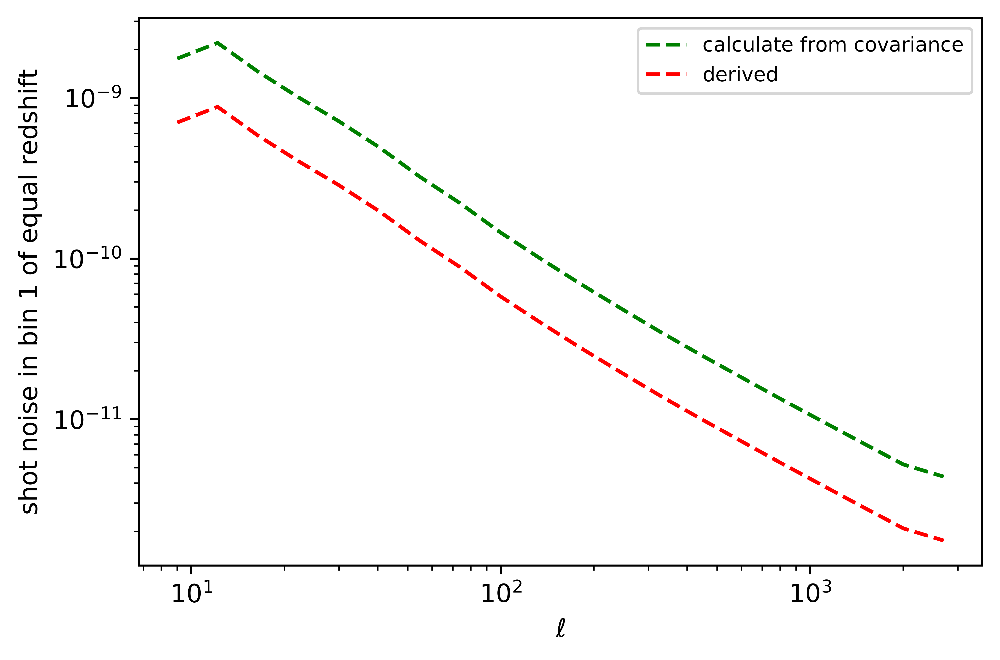

In [36]:
plt.figure()

plt.plot(binl, np.sqrt(binned_cov_shape_s["z_4"][:, 0, 0]), color='g', ls="--", label = "calculate from covariance")

plt.plot(binl, np.sqrt(shape_noise_z1.reshape(20)), color='r', ls="--", label = "derived")
plt.xscale('log')
plt.yscale('log')

plt.xlabel(r'$\ell$')
plt.ylabel('shot noise in bin 1 of equal redshift')
plt.legend(loc="upper right", fontsize=8)
plt.show() 

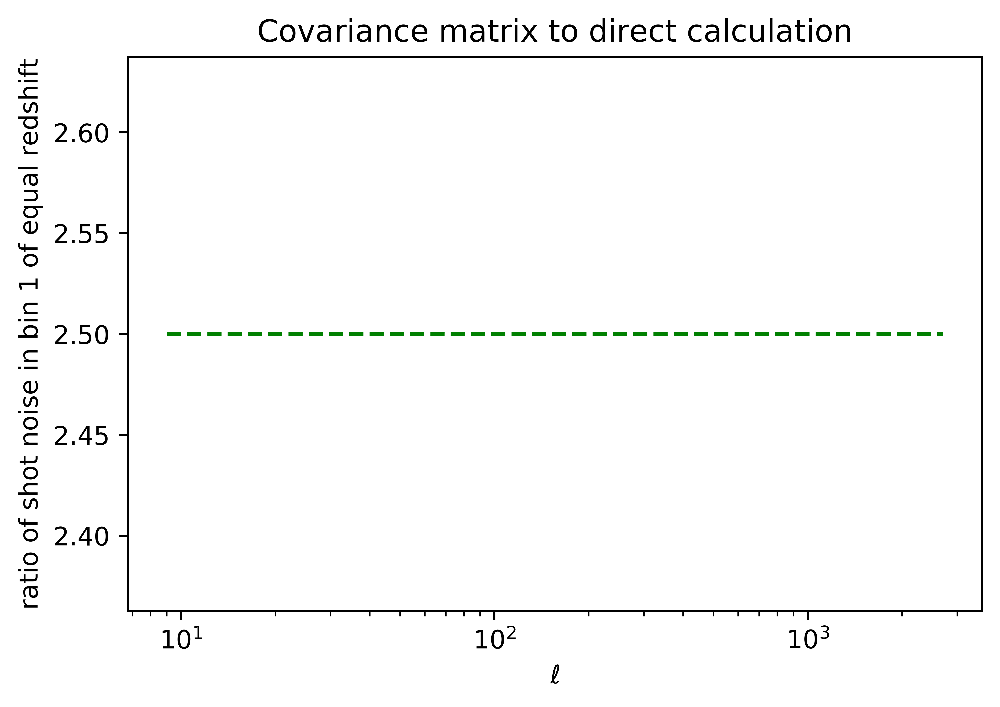

In [37]:
plt.figure()

plt.plot(binl, np.sqrt(binned_cov_shape_s["z_4"][:, 0, 0])/np.sqrt(shape_noise_z1.reshape(20)), color='g', ls="--")

plt.xscale('log')

plt.xlabel(r'$\ell$')
plt.ylabel('ratio of shot noise in bin 1 of equal redshift')
plt.title('Covariance matrix to direct calculation')
plt.show() 

why is it 2.5?

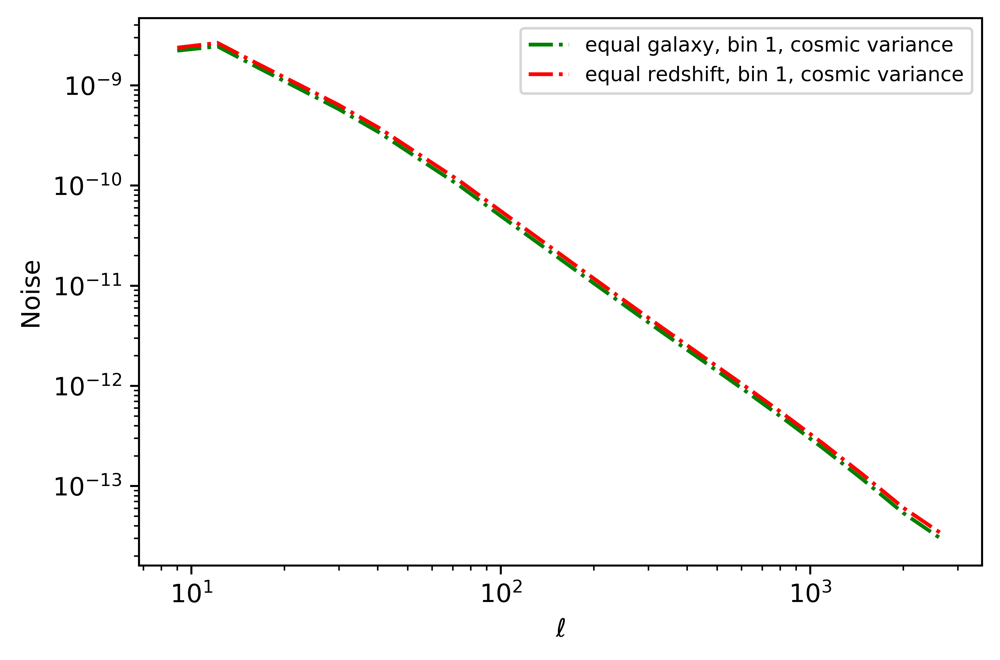

In [38]:
plt.figure()

plt.plot(binl, np.sqrt(binned_cov_cosvar_s["n_4"][:, 0, 0]), color='g', ls="-.", label = "equal galaxy, bin 1, cosmic variance")
plt.plot(binl, np.sqrt(binned_cov_cosvar_s["z_4"][:, 0, 0]), color='r', ls="-.", label = "equal redshift, bin 1, cosmic variance")

plt.xscale('log')
plt.yscale('log')

plt.xlabel(r'$\ell$')
plt.ylabel('Noise')
plt.legend(loc="upper right", fontsize=8)
plt.show() 

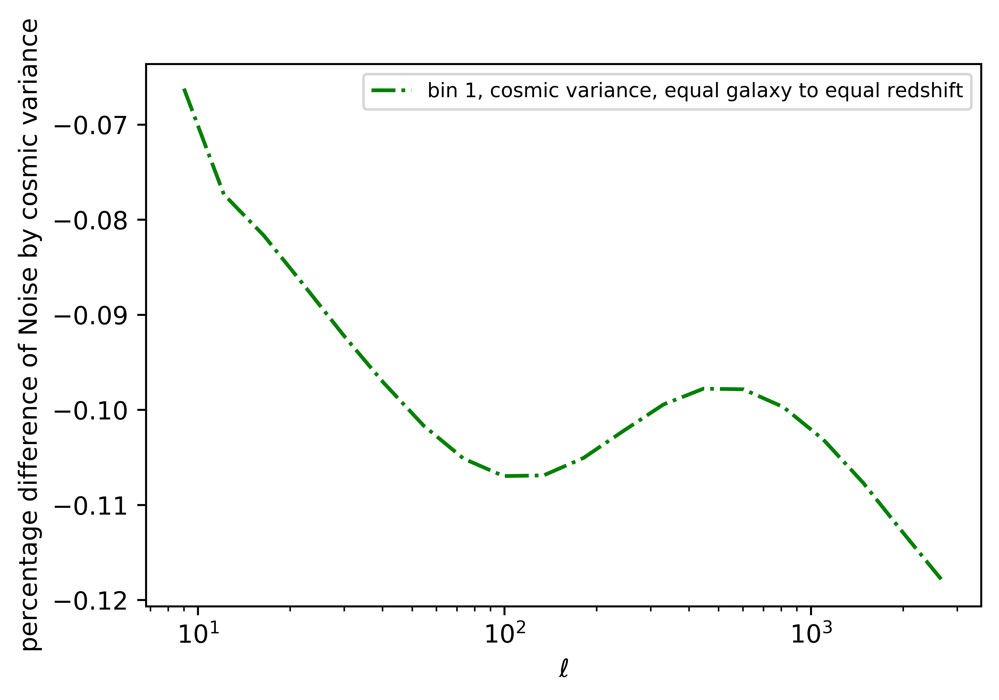

In [39]:
plt.figure()

plt.plot(binl, np.sqrt(binned_cov_cosvar_s["n_4"][:, 0, 0])/np.sqrt(binned_cov_cosvar_s["z_4"][:, 0, 0])-1, color='g', ls="-.", label = "bin 1, cosmic variance, equal galaxy to equal redshift")

plt.xscale('log')

plt.xlabel(r'$\ell$')
plt.ylabel('percentage difference of Noise by cosmic variance')
plt.legend(loc="upper right", fontsize=8)
plt.show() 

cosmic variance scale as the number of modes in l, as well as the strength of the signal itself $P_{kk}$. Since the equal redshift bin extend to higher redshift, it has higher signal, thus higher noise as well compared to the equal galaxy case for each l

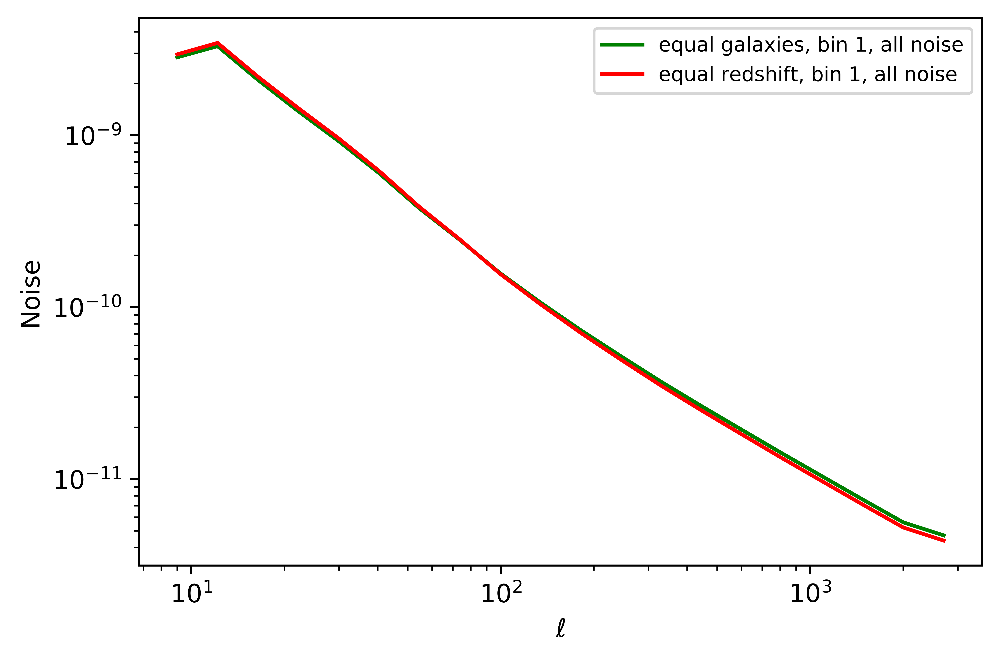

In [40]:
plt.figure()

plt.plot(binl, np.sqrt(binned_cov_s["n_4"][:, 0, 0]), color='g', label = "equal galaxies, bin 1, all noise")
plt.plot(binl, np.sqrt(binned_cov_s["z_4"][:, 0, 0]), color='r', label = "equal redshift, bin 1, all noise")

plt.xscale('log')
plt.yscale('log')

plt.xlabel(r'$\ell$')
plt.ylabel('Noise')
plt.legend(loc="upper right", fontsize=8)
plt.show() 

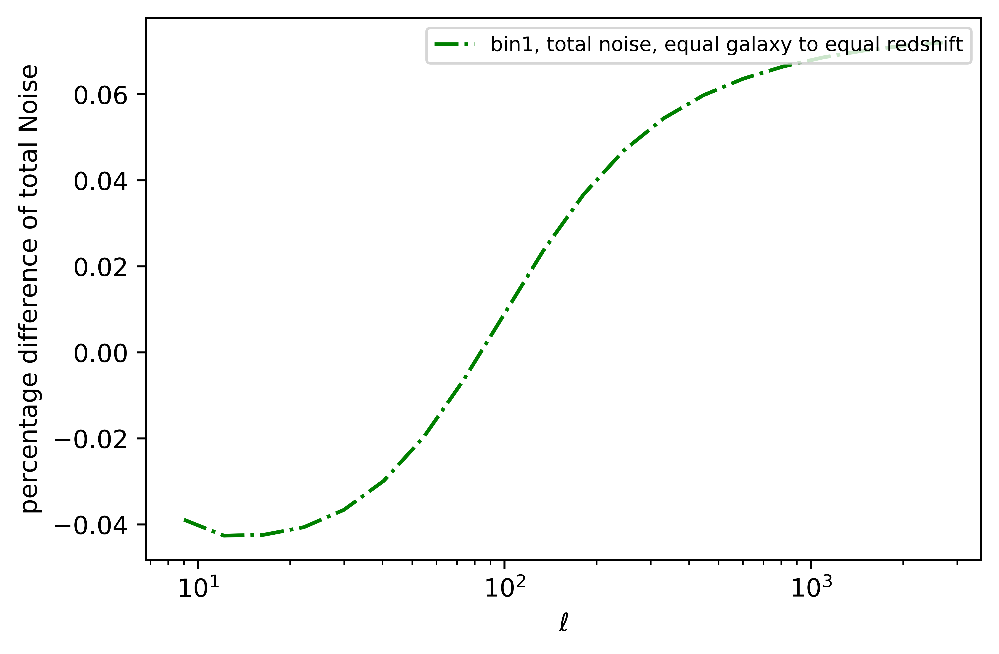

In [41]:
plt.figure()

plt.plot(binl, np.sqrt(binned_cov_s["n_4"][:, 0, 0])/np.sqrt(binned_cov_s["z_4"][:, 0, 0])-1, color='g', ls="-.", label = "bin1, total noise, equal galaxy to equal redshift")

plt.xscale('log')

plt.xlabel(r'$\ell$')
plt.ylabel('percentage difference of total Noise')
plt.legend(loc="upper right", fontsize=8)
plt.show() 

at large scale, cosmic variance dominate the noise since there are fewer modes. At small scale, shot noise dominate for having limited number of galaxies.

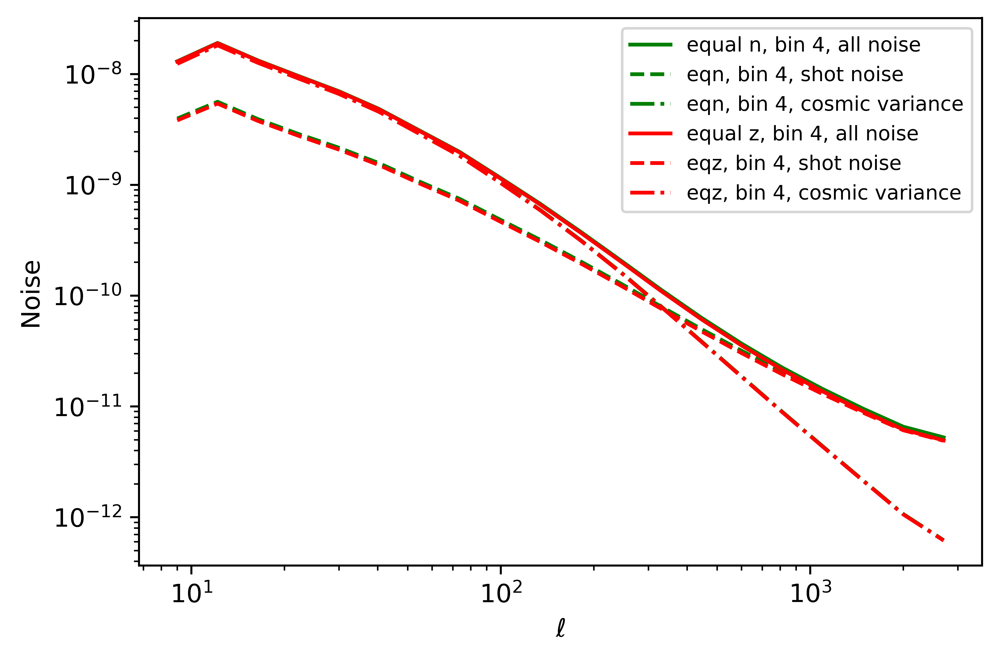

In [42]:
plt.figure()

plt.plot(binl, np.sqrt(binned_cov_s["n_4"][:, 9, 9]), color='g', label = "equal n, bin 4, all noise")
plt.plot(binl, np.sqrt(binned_cov_shape_s["n_4"][:, 9, 9]), color='g', ls="--", label = "eqn, bin 4, shot noise")
plt.plot(binl, np.sqrt(binned_cov_cosvar_s["n_4"][:, 9, 9]), color='g', ls="-.", label = "eqn, bin 4, cosmic variance")

plt.plot(binl, np.sqrt(binned_cov_s["z_4"][:, 9, 9]), color='r', label = "equal z, bin 4, all noise")
plt.plot(binl, np.sqrt(binned_cov_shape_s["z_4"][:, 9, 9]), color='r', ls="--", label = "eqz, bin 4, shot noise")
plt.plot(binl, np.sqrt(binned_cov_cosvar_s["z_4"][:, 9, 9]), color='r', ls="-.", label = "eqz, bin 4, cosmic variance")

plt.xscale('log')
plt.yscale('log')

plt.xlabel(r'$\ell$')
plt.ylabel('Noise')
plt.legend(loc="upper right", fontsize=8)
plt.show() 

at large scale (l<20), the cosmic variance dominate. at small scale (l>30), the shot noise dominate

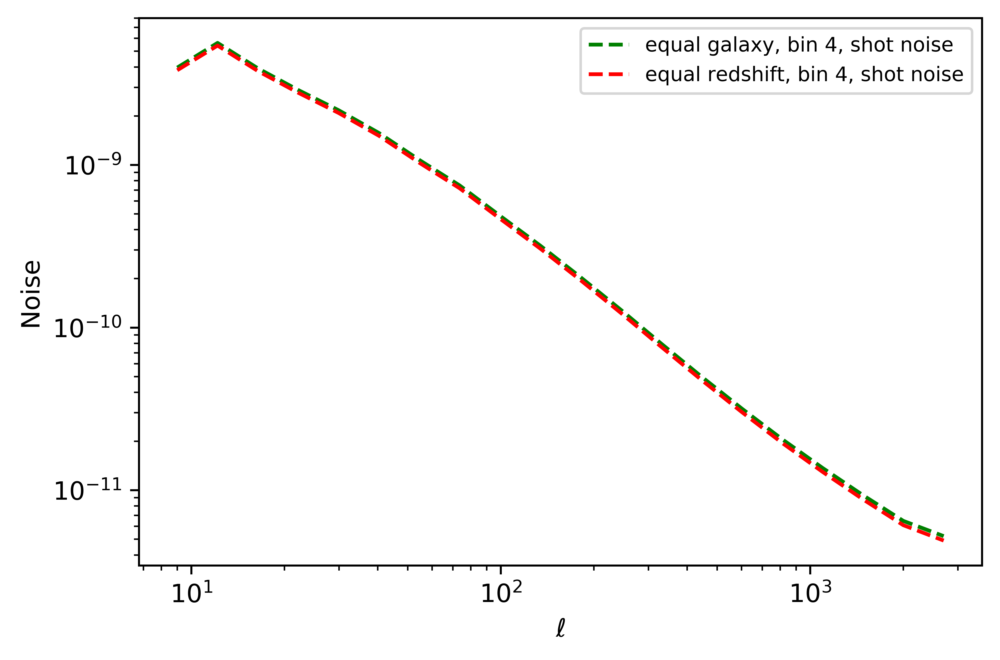

In [43]:
plt.figure()

plt.plot(binl, np.sqrt(binned_cov_shape_s["n_4"][:, 9, 9]), color='g', ls="--", label = "equal galaxy, bin 4, shot noise")

plt.plot(binl, np.sqrt(binned_cov_shape_s["z_4"][:, 9, 9]), color='r', ls="--", label = "equal redshift, bin 4, shot noise")
plt.xscale('log')
plt.yscale('log')

plt.xlabel(r'$\ell$')
plt.ylabel('Noise')
plt.legend(loc="upper right", fontsize=8)
plt.show() 

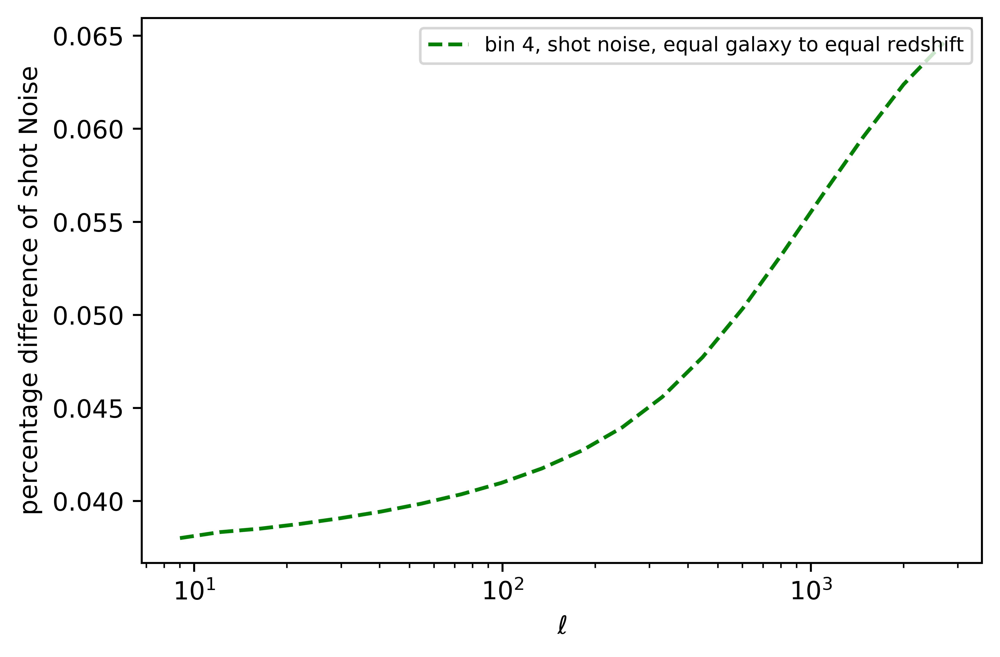

In [44]:
plt.figure()

plt.plot(binl, np.sqrt(binned_cov_shape_s["n_4"][:, 9, 9])/np.sqrt(binned_cov_shape_s["z_4"][:, 9, 9])-1, color='g', ls="--", label = "bin 4, shot noise, equal galaxy to equal redshift")
plt.xscale('log')

plt.xlabel(r'$\ell$')
plt.ylabel('percentage difference of shot Noise')
plt.legend(loc="upper right", fontsize=8)
plt.show() 

in bin 4, equal galaxy case start with higher redshift. Therefore, the signal in equal galaxy case is higher than signal in the equal redshift case. However, the number of galaxy is higher in equal redshift case.

As shotnoise scale with 1/number of galaxy^2 (this term is higher for equal galaxy), as well as with signal (this term is higher for equal galaxy as well). This plot met our expectation

In [45]:
ngz44=num_den(sliced_dndz_s["z_4"], numdenPerStr)[3]
shape_noise_z_4 = 2*(fsky/(2*ell+1))*(cl_s["z_4"][9, :]*0.23/ngz44 + 0.25*(0.23/ngz44)**2)
ngn44=num_den(sliced_dndz_s["n_4"], numdenPerStr)[3]
shape_noise_n_4 = 2*(fsky/(2*ell+1))*(cl_s["n_4"][9, :]*0.23/ngn44 + 0.25*(0.23/ngn44)**2)

In [46]:
shape_noise_n4=binnedCov(1, binl, shape_noise_n_4.reshape(2996, 1, 1), ell)
shape_noise_z4=binnedCov(1, binl, shape_noise_z_4.reshape(2996, 1, 1), ell)

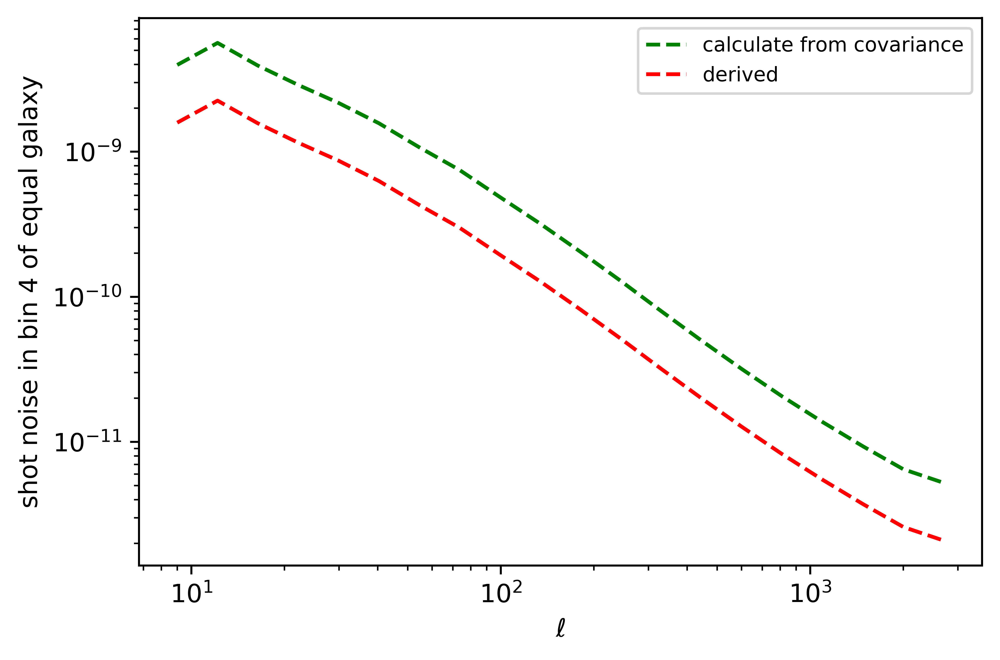

In [47]:
plt.figure()

plt.plot(binl, np.sqrt(binned_cov_shape_s["n_4"][:, 9, 9]), color='g', ls="--", label = "calculate from covariance")

plt.plot(binl, np.sqrt(shape_noise_n4.reshape(20)), color='r', ls="--", label = "derived")
plt.xscale('log')
plt.yscale('log')

plt.xlabel(r'$\ell$')
plt.ylabel('shot noise in bin 4 of equal galaxy')
plt.legend(loc="upper right", fontsize=8)
plt.show() 

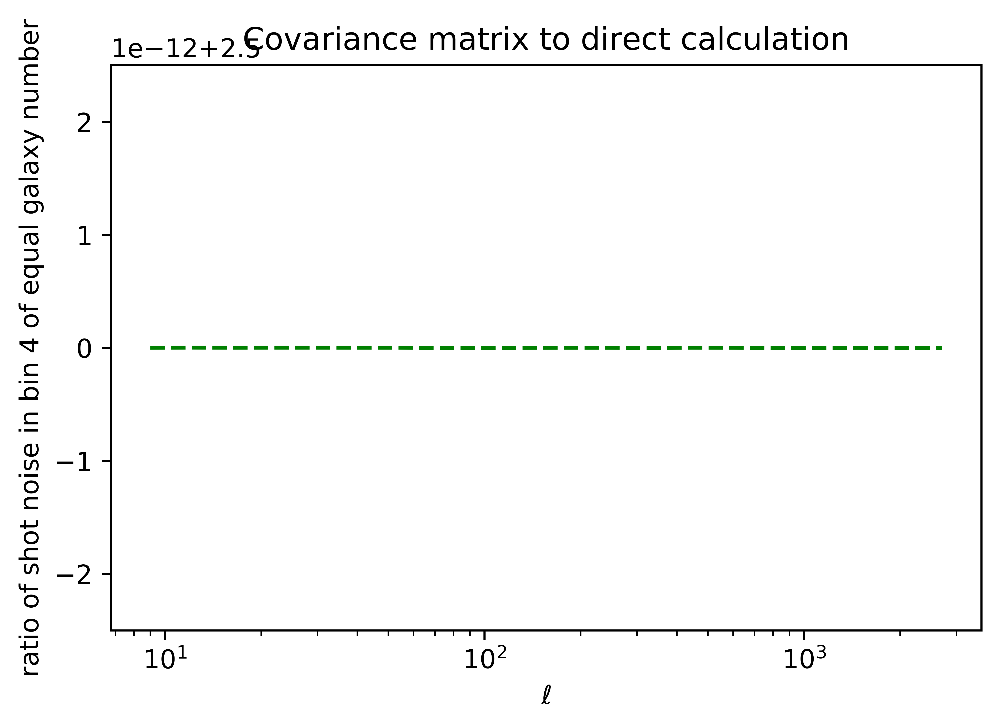

In [48]:
plt.figure()

plt.plot(binl, np.sqrt(binned_cov_shape_s["n_4"][:, 9, 9])/np.sqrt(shape_noise_n4.reshape(20)), color='g', ls="--")

plt.xscale('log')

plt.xlabel(r'$\ell$')
plt.ylabel('ratio of shot noise in bin 4 of equal galaxy number')
plt.title('Covariance matrix to direct calculation')
plt.show() 

In [49]:
 np.sqrt(binned_cov_shape_s["n_4"][:, 9, 9])/np.sqrt(shape_noise_n4.reshape(20))

array([2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5,
       2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5])

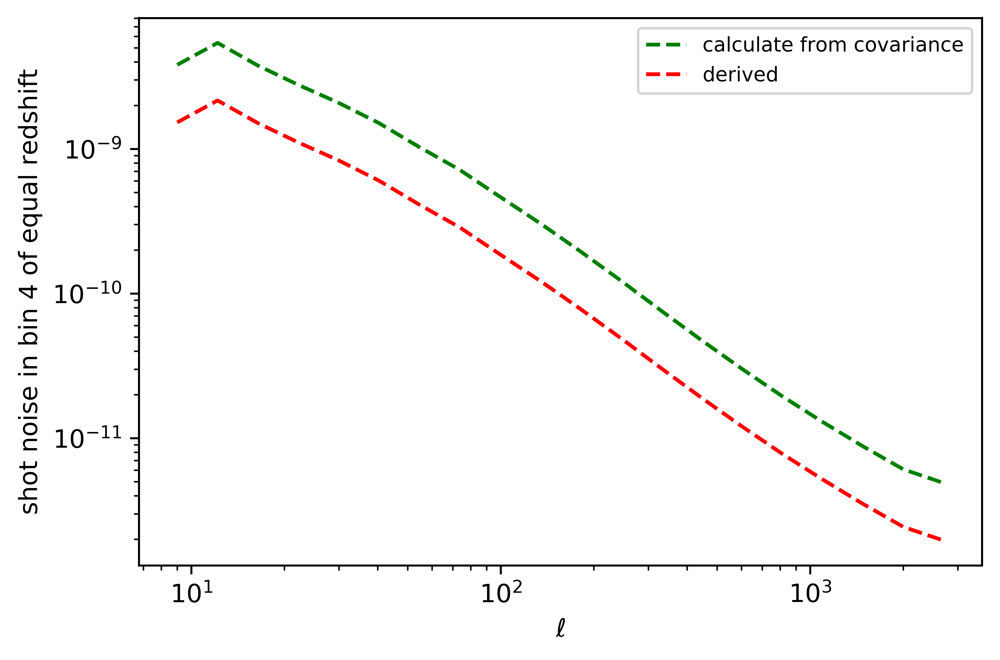

In [50]:
plt.figure()

plt.plot(binl, np.sqrt(binned_cov_shape_s["z_4"][:, 9, 9]), color='g', ls="--", label = "calculate from covariance")

plt.plot(binl, np.sqrt(shape_noise_z4.reshape(20)), color='r', ls="--", label = "derived")
plt.xscale('log')
plt.yscale('log')

plt.xlabel(r'$\ell$')
plt.ylabel('shot noise in bin 4 of equal redshift')
plt.legend(loc="upper right", fontsize=8)
plt.show() 

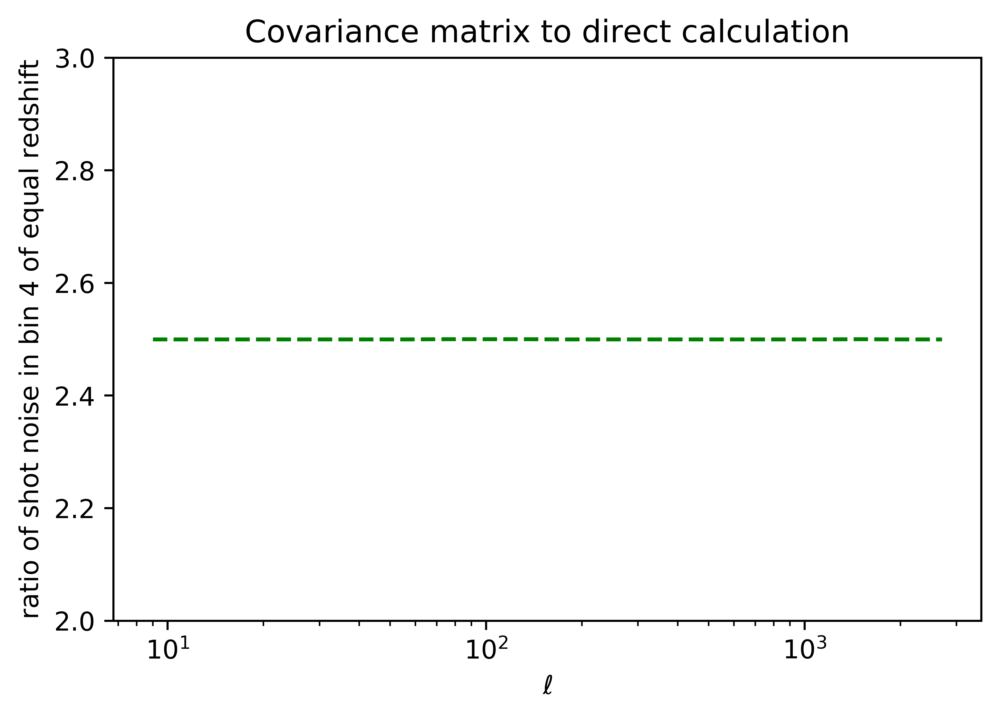

In [71]:
plt.figure()

plt.plot(binl, np.sqrt(binned_cov_shape_s["z_4"][:, 9, 9])/np.sqrt(shape_noise_z4.reshape(20)), color='g', ls="--")

plt.xscale('log')
plt.ylim(2.0,3.0)

plt.xlabel(r'$\ell$')
plt.ylabel('ratio of shot noise in bin 4 of equal redshift')
plt.title('Covariance matrix to direct calculation')
plt.show() 

In [69]:
 np.sqrt(binned_cov_shape_s["z_4"][:, 9, 9])/np.sqrt(shape_noise_z4.reshape(20))

array([2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5,
       2.5, 2.5, 2.5, 2.5, 2.5, 2.5, 2.5])

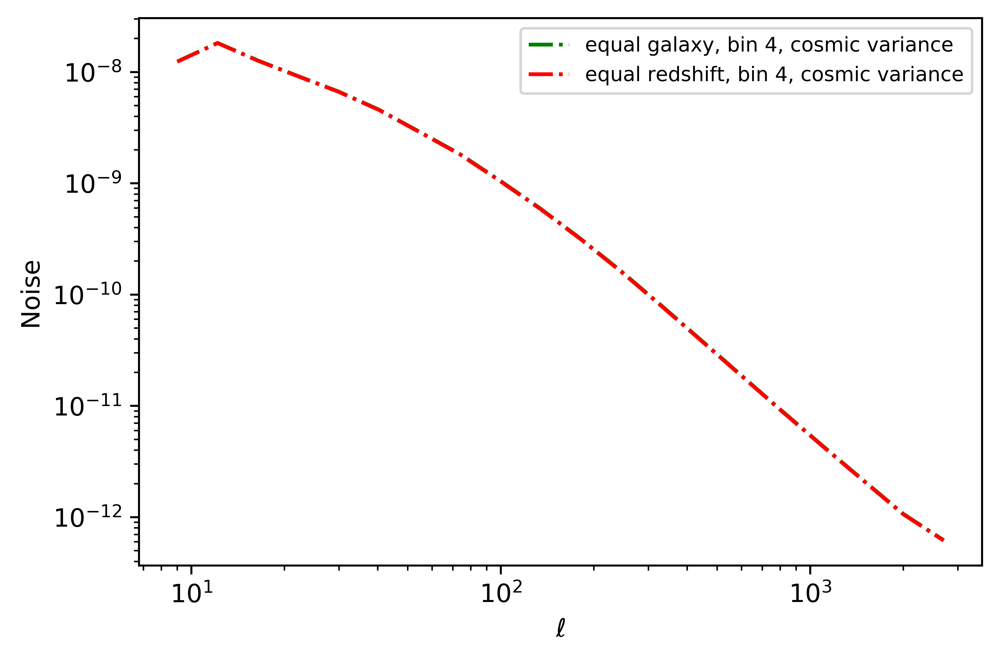

In [52]:
plt.figure()

plt.plot(binl, np.sqrt(binned_cov_cosvar_s["n_4"][:, 9, 9]), color='g', ls="-.", label = "equal galaxy, bin 4, cosmic variance")
plt.plot(binl, np.sqrt(binned_cov_cosvar_s["z_4"][:, 9, 9]), color='r', ls="-.", label = "equal redshift, bin 4, cosmic variance")

plt.xscale('log')
plt.yscale('log')

plt.xlabel(r'$\ell$')
plt.ylabel('Noise')
plt.legend(loc="upper right", fontsize=8)
plt.show() 

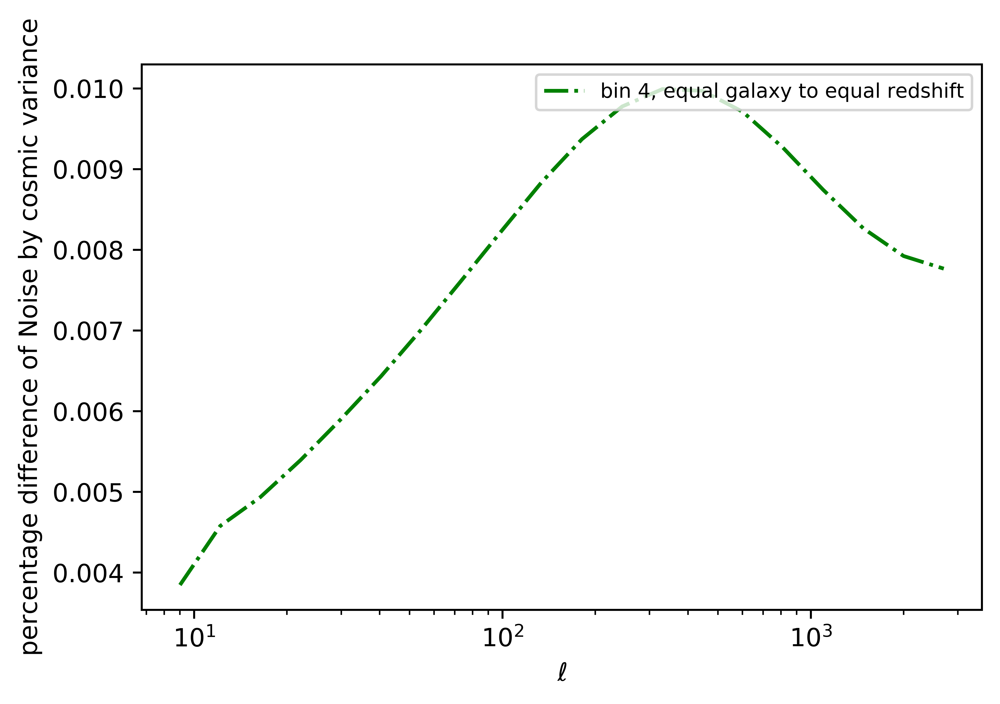

In [53]:
plt.figure()

plt.plot(binl, np.sqrt(binned_cov_cosvar_s["n_4"][:, 9, 9])/np.sqrt(binned_cov_cosvar_s["z_4"][:, 9, 9])-1, color='g', ls="-.", label = "bin 4, equal galaxy to equal redshift")

plt.xscale('log')

plt.xlabel(r'$\ell$')
plt.ylabel('percentage difference of Noise by cosmic variance')
plt.legend(loc="upper right", fontsize=8)
plt.show() 

in bin 4, equal galaxy case start with higher redshift. Therefore, the signal in higher galaxy case is higher than the equal redshift case.

we expect equal galaxy case to have higher cosmic variance than equal redshift case. which is what's shown here

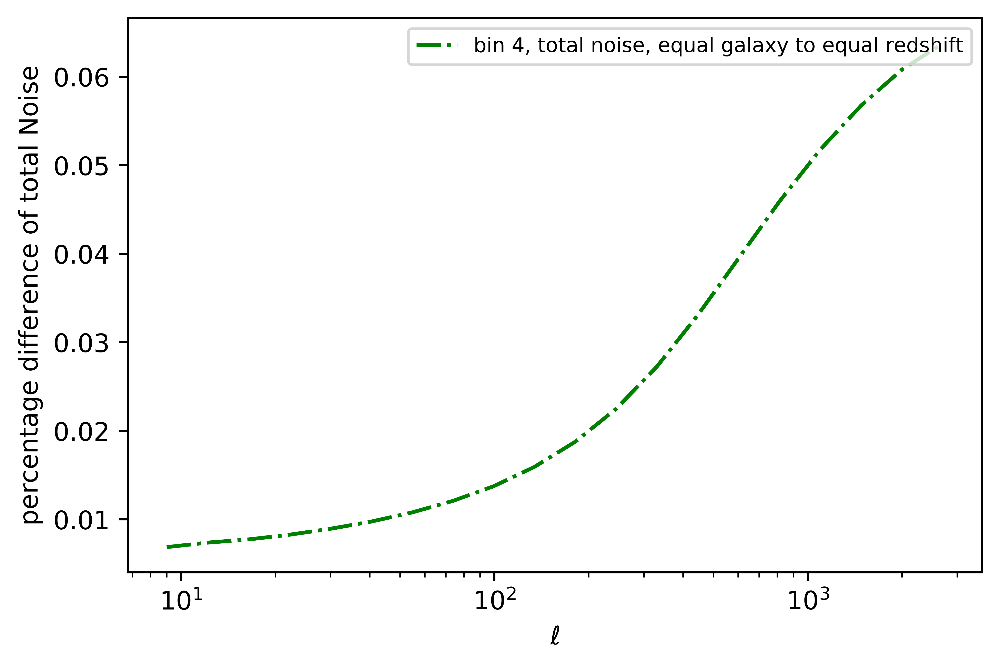

In [54]:
plt.figure()

plt.plot(binl, np.sqrt(binned_cov_s["n_4"][:, 9, 9])/np.sqrt(binned_cov_s["z_4"][:, 9, 9])-1, color='g', ls="-.", label = "bin 4, total noise, equal galaxy to equal redshift")

plt.xscale('log')

plt.xlabel(r'$\ell$')
plt.ylabel('percentage difference of total Noise')
plt.legend(loc="upper right", fontsize=8)
plt.show() 

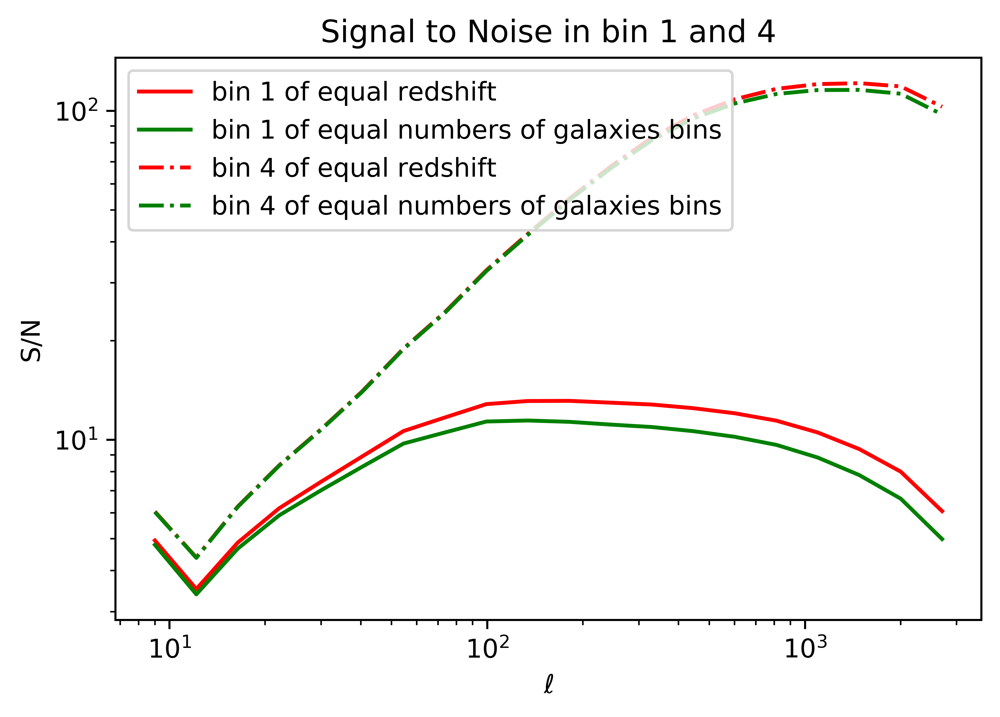

In [55]:
plt.figure()

plt.plot(binl, normalizing(binned_cl_s["z_4"][0], binl)/normalizing(np.sqrt(binned_cov_s["z_4"][:, 0, 0]), binl), color='r', label = "bin 1 of equal redshift")
plt.plot(binl, normalizing(binned_cl_s["n_4"][0], binl)/normalizing(np.sqrt(binned_cov_s["n_4"][:, 0, 0]), binl), color='g', label = "bin 1 of equal numbers of galaxies bins")

plt.plot(binl, normalizing(binned_cl_s["z_4"][9], binl)/normalizing(np.sqrt(binned_cov_s["z_4"][:, 9, 9]), binl), color='r', ls='-.', label = "bin 4 of equal redshift")
plt.plot(binl, normalizing(binned_cl_s["n_4"][9], binl)/normalizing(np.sqrt(binned_cov_s["n_4"][:, 9, 9]), binl), color='g', ls='-.', label = "bin 4 of equal numbers of galaxies bins")


plt.xscale('log')
plt.yscale('log')

plt.xlabel(r'$\ell$')
plt.ylabel('S/N')
plt.legend(loc="upper left")
plt.title("Signal to Noise in bin 1 and 4")
plt.show() 

In [56]:
0, 4, 7, 9

(0, 4, 7, 9)

In [57]:
def SignalToNoise_o(cl, cov):
    """calculate the signal to noise for the given cl signal, and covariance array, in a single tomographic bin"""
    stn_sq = 0
    for i in range(len(cl)):
        stn_sq = stn_sq + cl[i]**2/ cov[i]
    stn = np.sqrt(stn_sq)
    return stn

In [58]:
stn_4 = {}
stn_cosvar = {}
stn_shape = {}
for btype in ["n", "z"]:
    for i, x in enumerate([0, 4, 7, 9]):
        stn_4["{0}_{1}".format(btype,i+1)] = SignalToNoise_o(binned_cl_s["{0}_4".format(btype)][x], binned_cov_s["{0}_4".format(btype)][:, x, x])
        stn_cosvar["{0}_{1}".format(btype, i+1)] = SignalToNoise_o(binned_cl_s["{0}_4".format(btype)][x], binned_cov_cosvar_s["{0}_4".format(btype)][:, x, x])
        stn_shape["{0}_{1}".format(btype, i+1)] = SignalToNoise_o(binned_cl_s["{0}_4".format(btype)][x], binned_cov_shape_s["{0}_4".format(btype)][:, x, x])
        

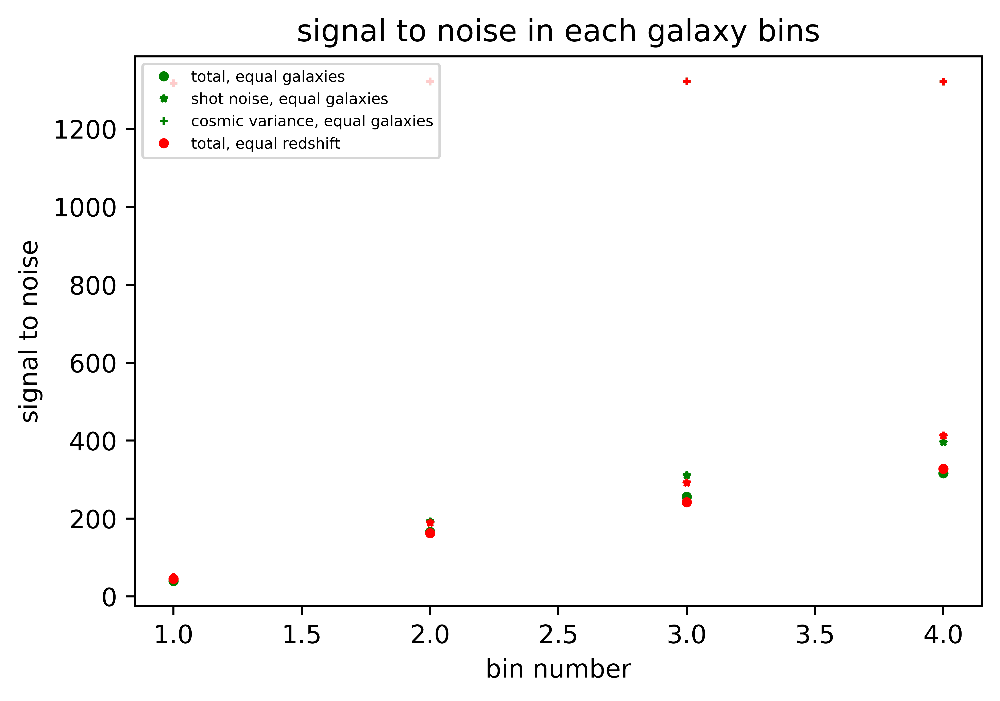

In [59]:
params = {'legend.fontsize': 8,
          'legend.handlelength': 2}
plt.rcParams.update(params)
plt.figure()
plt.plot([1, 2, 3, 4], [stn_4["n_1"], stn_4["n_2"],stn_4["n_3"], stn_4["n_4"]],
         color='g', linestyle='None', marker ="o", markersize = 3.0, label = "total, equal galaxies")

plt.plot([1, 2, 3, 4], [stn_shape["n_1"], stn_shape["n_2"],stn_shape["n_3"], stn_shape["n_4"]],
         color='g', linestyle='None', marker ="*", markersize = 3.0, label = "shot noise, equal galaxies")

plt.plot([1, 2, 3, 4], [stn_cosvar["n_1"], stn_cosvar["n_2"],stn_cosvar["n_3"], stn_cosvar["n_4"]],
         color='g', linestyle='None', marker ="+", markersize = 3.0, label = "cosmic variance, equal galaxies")

plt.plot([1, 2, 3, 4], [stn_4["z_1"], stn_4["z_2"],stn_4["z_3"], stn_4["z_4"]],
         color='r', linestyle='None', marker ="o", markersize = 3.0, label = "total, equal redshift")

plt.plot([1, 2, 3, 4], [stn_shape["z_1"], stn_shape["z_2"],stn_shape["z_3"], stn_shape["z_4"]],
         color='r', linestyle='None', marker ="*", markersize = 3.0)

plt.plot([1, 2, 3, 4], [stn_cosvar["z_1"], stn_cosvar["z_2"],stn_cosvar["z_3"], stn_cosvar["z_4"]],
         color='r', linestyle='None', marker ="+", markersize = 3.0)

plt.xlabel("bin number")
plt.ylabel("signal to noise")
plt.title("signal to noise in each galaxy bins")
plt.legend(loc="upper left", fontsize=6)
plt.show() 

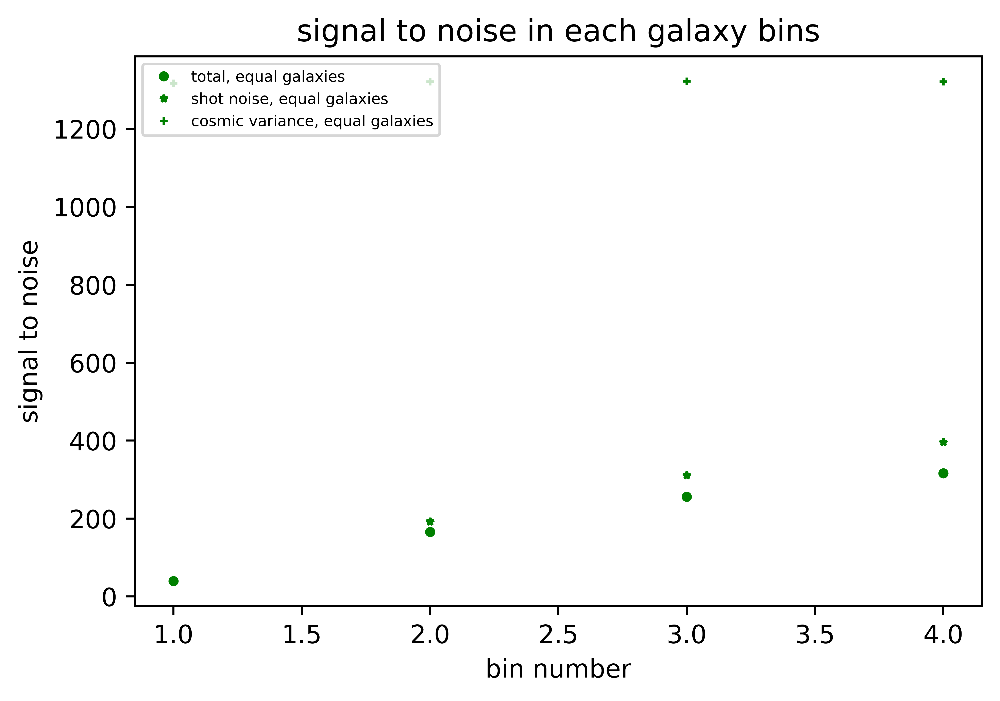

In [60]:
params = {'legend.fontsize': 8,
          'legend.handlelength': 2}
plt.rcParams.update(params)
plt.figure()
plt.plot([1, 2, 3, 4], [stn_4["n_1"], stn_4["n_2"],stn_4["n_3"], stn_4["n_4"]],
         color='g', linestyle='None', marker ="o", markersize = 3.0, label = "total, equal galaxies")

plt.plot([1, 2, 3, 4], [stn_shape["n_1"], stn_shape["n_2"],stn_shape["n_3"], stn_shape["n_4"]],
         color='g', linestyle='None', marker ="*", markersize = 3.0, label = "shot noise, equal galaxies")

plt.plot([1, 2, 3, 4], [stn_cosvar["n_1"], stn_cosvar["n_2"],stn_cosvar["n_3"], stn_cosvar["n_4"]],
         color='g', linestyle='None', marker ="+", markersize = 3.0, label = "cosmic variance, equal galaxies")
plt.xlabel("bin number")
plt.ylabel("signal to noise")
plt.legend(loc="upper left", fontsize=6)
plt.title("signal to noise in each galaxy bins")
plt.show() 

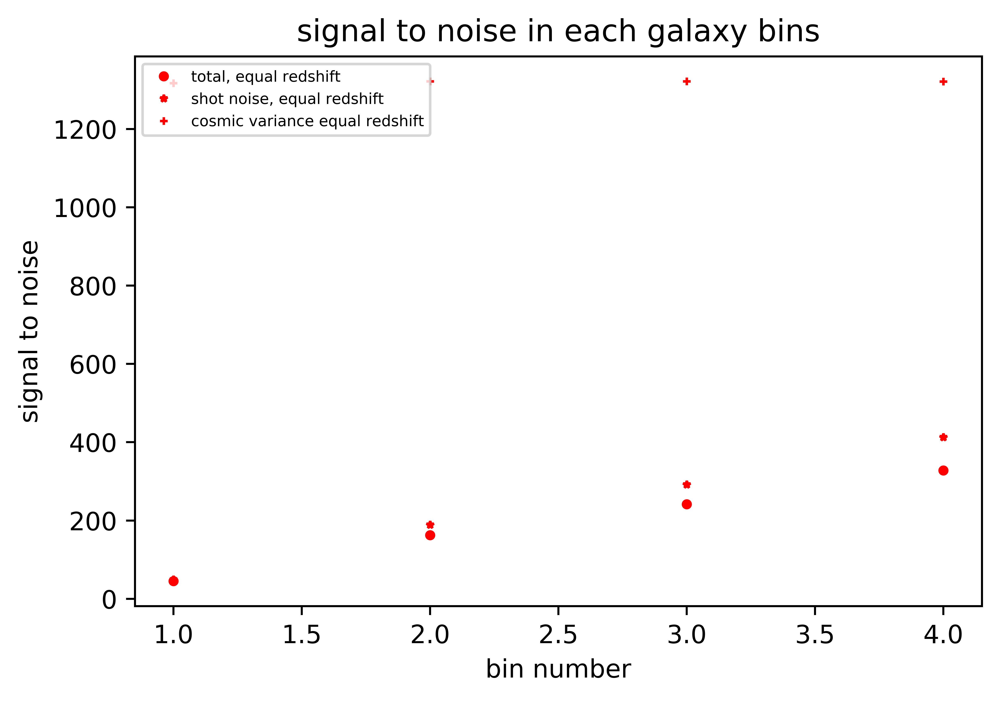

In [61]:
params = {'legend.fontsize': 8,
          'legend.handlelength': 2}
plt.rcParams.update(params)
plt.figure()

plt.plot([1, 2, 3, 4], [stn_4["z_1"], stn_4["z_2"],stn_4["z_3"], stn_4["z_4"]],
         color='r', linestyle='None', marker ="o", markersize = 3.0, label = "total, equal redshift")

plt.plot([1, 2, 3, 4], [stn_shape["z_1"], stn_shape["z_2"],stn_shape["z_3"], stn_shape["z_4"]],
         color='r', linestyle='None', marker ="*", markersize = 3.0, label = "shot noise, equal redshift")

plt.plot([1, 2, 3, 4], [stn_cosvar["z_1"], stn_cosvar["z_2"],stn_cosvar["z_3"], stn_cosvar["z_4"]],
         color='r', linestyle='None', marker ="+", markersize = 3.0, label = "cosmic variance equal redshift")

plt.xlabel("bin number")
plt.ylabel("signal to noise")
plt.legend(loc="upper left", fontsize=6)
plt.title("signal to noise in each galaxy bins")
plt.show() 

in both case, the shot noise dominate signal to noise
as bin goes into higher redshift, the shot noise become less significant

In [62]:
 [stn_cosvar["n_1"], stn_cosvar["n_2"],stn_cosvar["n_3"], stn_cosvar["n_4"]]

[1316.8227395389279,
 1321.4740037429708,
 1321.7577465713914,
 1321.2859230944778]

In [63]:
[stn_cosvar["z_1"], stn_cosvar["z_2"],stn_cosvar["z_3"], stn_cosvar["z_4"]]

[1317.215250768366, 1321.5490942044428, 1321.770961345131, 1321.3028404243928]

In [64]:
[stn_cosvar["z_1"]/stn_cosvar["n_1"], stn_cosvar["z_2"]/stn_cosvar["n_2"],stn_cosvar["z_3"]/stn_cosvar["n_3"], stn_cosvar["z_4"]/stn_cosvar["n_4"]]

[1.0002980744618488,
 1.0000568232604343,
 1.0000099978787897,
 1.0000128036858786]

signal to noise value for cosmic variance stay within 0.01% difference for the two binning across all bins

in both case, cosmic variance is the smaller contribution to signal to noise. future more, in each bin, both cases have similar value of signal to noise for cosmic variance (within 10^-3 difference)

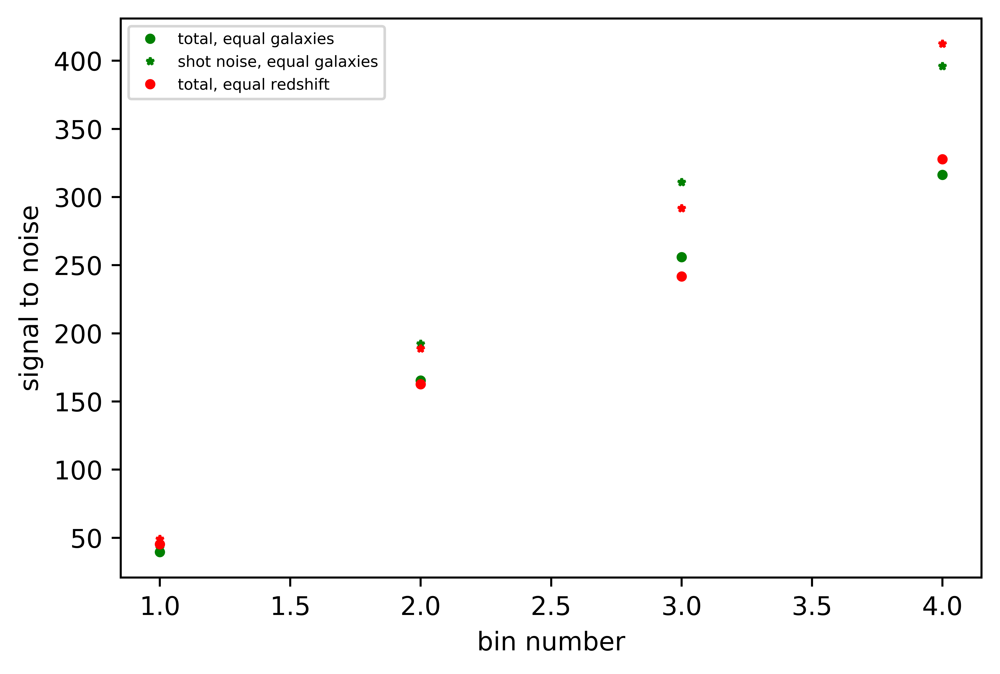

In [65]:
params = {'legend.fontsize': 8,
          'legend.handlelength': 2}
plt.rcParams.update(params)
plt.figure()
plt.plot([1, 2, 3, 4], [stn_4["n_1"], stn_4["n_2"],stn_4["n_3"], stn_4["n_4"]],
         color='g', linestyle='None', marker ="o", markersize = 3.0, label = "total, equal galaxies")

plt.plot([1, 2, 3, 4], [stn_shape["n_1"], stn_shape["n_2"],stn_shape["n_3"], stn_shape["n_4"]],
         color='g', linestyle='None', marker ="*", markersize = 3.0, label = "shot noise, equal galaxies")


plt.plot([1, 2, 3, 4], [stn_4["z_1"], stn_4["z_2"],stn_4["z_3"], stn_4["z_4"]],
         color='r', linestyle='None', marker ="o", markersize = 3.0, label = "total, equal redshift")

plt.plot([1, 2, 3, 4], [stn_shape["z_1"], stn_shape["z_2"],stn_shape["z_3"], stn_shape["z_4"]],
         color='r', linestyle='None', marker ="*", markersize = 3.0)

plt.xlabel("bin number")
plt.ylabel("signal to noise")
plt.legend(loc="upper left", fontsize=6)
plt.show() 

contribution from shot noise to signal to noise is higher for equal redshift case in bin 1 and 4 , and for equal galaxy case in bin 2 and 3.

let's remind us again the binning.

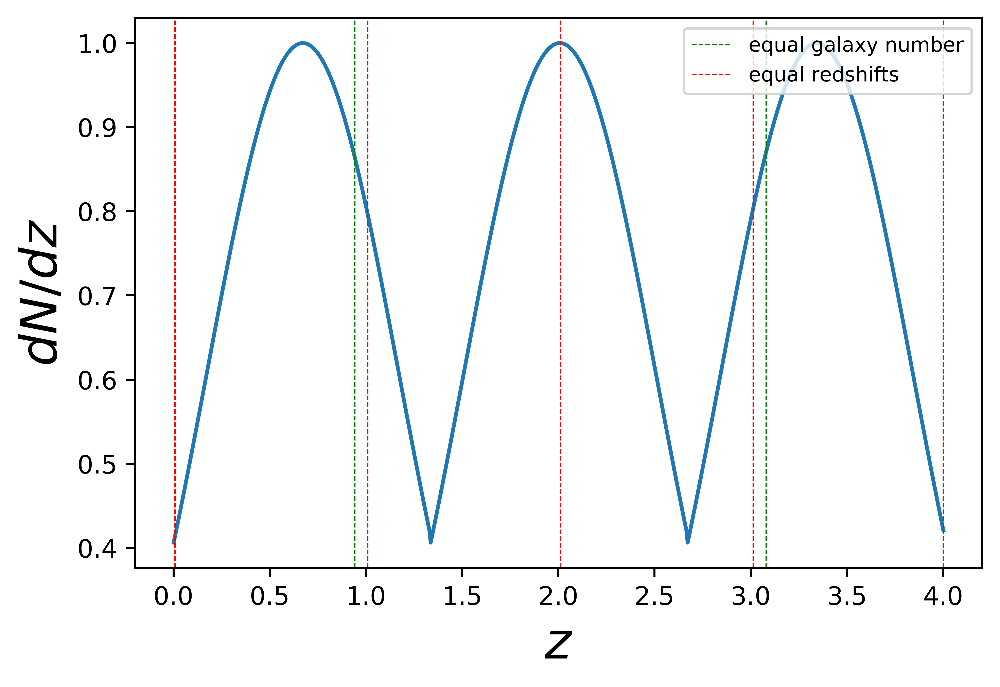

In [66]:
#quick remind
plt.plot(dndz_s[:,0], dndz_s[:,1])
plt.xlabel(r'$z$',fontsize=20)
plt.ylabel(r'$dN/dz$',fontsize=20)
for x in redshifts_s["n_4"]:
    plt.axvline(x, linewidth=0.5, color="g", linestyle="--")
plt.axvline(x, linewidth=0.5, color="g", linestyle="--", label="equal galaxy number")

for x in redshifts_s["z_4"]:
    plt.axvline(x, linewidth=0.5, color="r", linestyle="--")
plt.axvline(x, linewidth=0.5, color="r", linestyle="--", label="equal redshifts")

plt.legend(loc='upper right')
plt.show()

in bin 1, equal redshift bin have higher signal, and lower shot noise as well, which make the signal to noise in equal redshift bin to be higher than that of equal galaxy number bin

in bin 2, equal redshift bin again have higher signal. Let's check the shot noise below

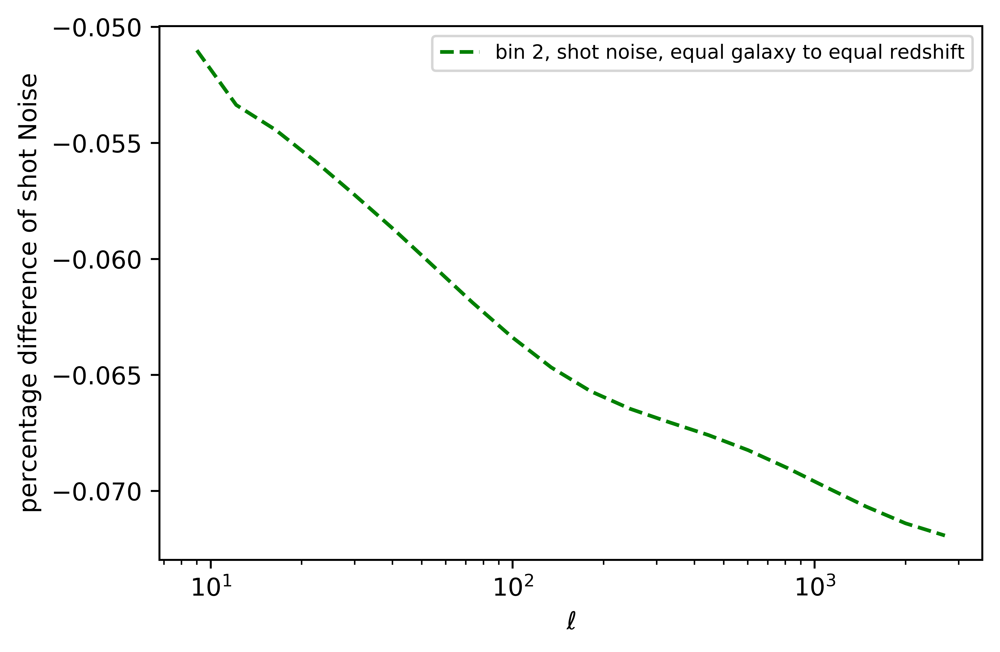

In [67]:
plt.figure()

plt.plot(binl, np.sqrt(binned_cov_shape_s["n_4"][:, 4, 4])/np.sqrt(binned_cov_shape_s["z_4"][:, 4, 4])-1, color='g', ls="--", label = "bin 2, shot noise, equal galaxy to equal redshift")
plt.xscale('log')

plt.xlabel(r'$\ell$')
plt.ylabel('percentage difference of shot Noise')
plt.legend(loc="upper right", fontsize=8)
plt.show() 

bin 2 of equal redshift starts with higher redshift compared to bin 2 of equal galaxy, therefore, bin 2 of equal redshift would include less number of galaxy. The equal redshift bin would also have higher signal. the first term of shot noise scale as 1/number of galaxies^2 (this term would be higher for equal redshift case), as well as signal (this term would be higher for equal redshift as well). Indeed, we see higher shot noise for equal redshift in the plot above


according to the plot, the equal redshift case would have higher shot noise as well as higher signal. therefore, we cannot directly conclude which case has higher signal to noise. we saw a higher S/N value calculated for equal galaxy case in earlier plot.

Does the 3rd bin make sense?

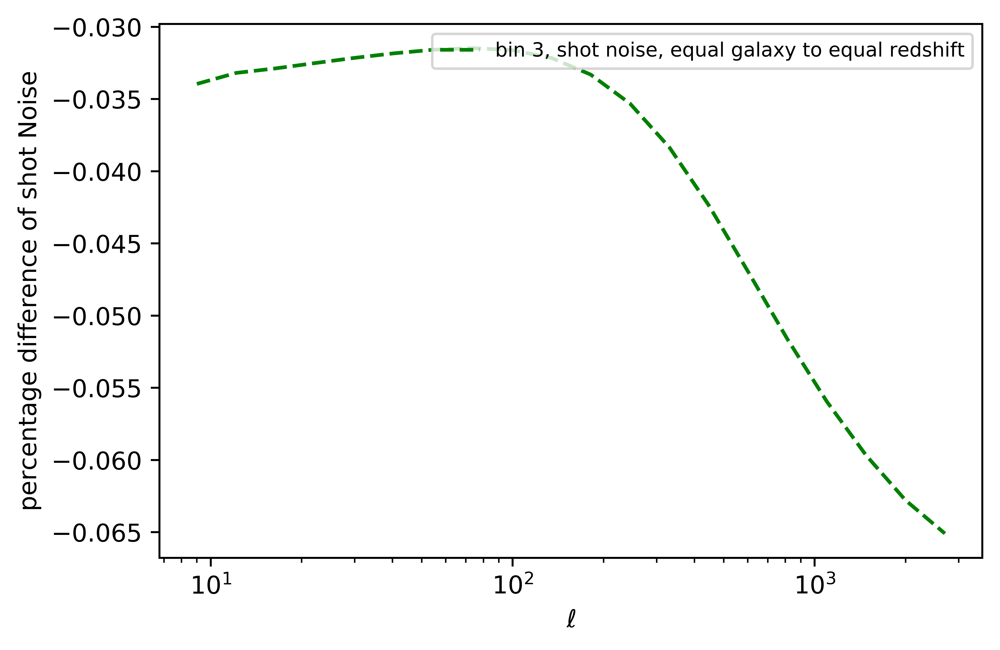

In [68]:
plt.figure()

plt.plot(binl, np.sqrt(binned_cov_shape_s["n_4"][:, 7, 7])/np.sqrt(binned_cov_shape_s["z_4"][:, 7, 7])-1, color='g', ls="--", label = "bin 3, shot noise, equal galaxy to equal redshift")
plt.xscale('log')

plt.xlabel(r'$\ell$')
plt.ylabel('percentage difference of shot Noise')
plt.legend(loc="upper right", fontsize=8)
plt.show() 

bin 3 of equal redshift end with lower redshift compared to bin 3 of equal galaxy, therefore, bin 3 of equal redshift would include less number of galaxy. The equal redshift bin would also have lower signal. the first term shot noise scale as 1/number of galaxies^2 (this term would be higher for equal redshift case), as well as signal (this term would be higher for equal galaxy number). The second term scaled as 1/number of galaxies^4 (this would be higher for redshift case as well). we see higher shot noise for equal redshift in the plot above, the reasonable explanation (only if the calculation here is correct) is that noise contribution from number of galaxy suppress the noise contribution of signal.

according to the plot, the equal galaxy case would have lower shot noise. At the mean time, the signal in equal galaxy case is higher. Therefore, we expect a higher signal to noise in equal galaxy case for bin 3.


As we had analyzed in entry 31, in bin 4, equal galaxy case start with higher redshift. Therefore, the signal in equal galaxy case is higher than signal in the equal redshift case. However, the number of galaxy is higher in equal redshift case. shotnoise scale with 1/number of galaxy^2 (this term is higher for equal galaxy), as well as with signal (this term is higher for equal galaxy as well). And this is what we see in previous plot.

The equal galaxy case would have higher shot noise as well as higher signal, so we cannot directly determine which case would have higher signal to noise. We see a higher signal to noise in equal redshift case for bin 4.